# 🤖 NewsBot Intelligence System
## ITAI 2373 - Mid-Term Group Project Template

**Team Members:** [Add your names here]
**Date:** [Add date]
**GitHub Repository:** [Add your repo URL here]

---

## 🎯 Project Overview

Welcome to your NewsBot Intelligence System! This notebook will guide you through building a comprehensive NLP system that:

- 📰 **Processes** news articles with advanced text cleaning
- 🏷️ **Classifies** articles into categories (Politics, Sports, Technology, Business, Entertainment, Health)
- 🔍 **Extracts** named entities (people, organizations, locations, dates, money)
- 😊 **Analyzes** sentiment and emotional tone
- 📊 **Generates** insights for business intelligence

### 📚 Module Integration Checklist
- [ ] **Module 1:** NLP applications and real-world context
- [ ] **Module 2:** Text preprocessing pipeline
- [ ] **Module 3:** TF-IDF feature extraction
- [ ] **Module 4:** POS tagging analysis
- [ ] **Module 5:** Syntax parsing and semantic analysis
- [ ] **Module 6:** Sentiment and emotion analysis
- [ ] **Module 7:** Text classification system
- [ ] **Module 8:** Named Entity Recognition

---

## 📦 Setup and Installation

Let's start by installing and importing all the libraries we'll need for our NewsBot system.

In [44]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("gpreda/bbc-news")

print("Path to dataset files:", path)

100%|██████████| 3.64M/3.64M [00:01<00:00, 3.69MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/gpreda/bbc-news/versions/1007


In [45]:
# Install required packages (run this cell first!)
!pip install spacy scikit-learn nltk pandas matplotlib seaborn wordcloud plotly
!python -m spacy download en_core_web_sm

# Download NLTK data
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('vader_lexicon')
nltk.download('averaged_perceptron_tagger')

print("✅ All packages installed successfully!")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 37.3 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...


✅ All packages installed successfully!


[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


In [46]:
# Import all necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import plotly.express as px
import plotly.graph_objects as go
from collections import Counter, defaultdict
import re
import warnings
warnings.filterwarnings('ignore')

# NLP Libraries
import spacy
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.tag import pos_tag

# Scikit-learn for machine learning
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.pipeline import Pipeline

# Load spaCy model
nlp = spacy.load('en_core_web_sm')

# Set up plotting style
plt.style.use('default')
sns.set_palette("husl")

print("📚 All libraries imported successfully!")
print(f"🔧 spaCy model loaded: {nlp.meta['name']} v{nlp.meta['version']}")

📚 All libraries imported successfully!
🔧 spaCy model loaded: core_web_sm v3.8.0


## 📊 Data Loading and Exploration

### 🎯 Module 1: Understanding Our NLP Application

Before we dive into the technical implementation, let's understand the real-world context of our NewsBot Intelligence System. This system addresses several business needs:

1. **Media Monitoring:** Automatically categorize and track news coverage
2. **Business Intelligence:** Extract key entities and sentiment trends
3. **Content Management:** Organize large volumes of news content
4. **Market Research:** Understand public sentiment about topics and entities

**💡 Discussion Question:** What other real-world applications can you think of for this type of system? Consider different industries and use cases.

In [47]:
# Step 1: Install dependencies
!pip install scikit-learn --quiet

# Step 2: Load 20 Newsgroups Dataset from sklearn
from sklearn.datasets import fetch_20newsgroups
import pandas as pd

# Fetch both train and test to maximize data size
newsgroups_train = fetch_20newsgroups(subset='train', remove=('headers', 'footers', 'quotes'))
newsgroups_test = fetch_20newsgroups(subset='test', remove=('headers', 'footers', 'quotes'))

# Combine train and test
data = newsgroups_train.data + newsgroups_test.data
targets = newsgroups_train.target.tolist() + newsgroups_test.target.tolist()
target_names = newsgroups_train.target_names

# Build DataFrame
df = pd.DataFrame({
    'article_id': range(1, len(data) + 1),
    'title': [f"Article {i}" for i in range(1, len(data) + 1)],
    'content': data,
    'category': [target_names[i] for i in targets],
    'date': ['2025-01-01'] * len(data),
    'source': ['20Newsgroups'] * len(data)
})

# Only keep relevant columns if needed
df = df[['article_id', 'title', 'content', 'category', 'date', 'source']]

# Show summary
print("✅ Dataset loaded successfully!")
print(f"📈 Shape: {df.shape}")
print(f"📋 Categories: {df['category'].nunique()} unique categories")
print(f"🔢 Example categories: {df['category'].unique()[:5]}")

# Preview
df.head()


✅ Dataset loaded successfully!
📈 Shape: (18846, 6)
📋 Categories: 20 unique categories
🔢 Example categories: ['rec.autos' 'comp.sys.mac.hardware' 'comp.graphics' 'sci.space'
 'talk.politics.guns']


,article_id,title,content,category,date,source
0,1,Article 1,I was wondering if anyone out there could enli...,rec.autos,2025-01-01,20Newsgroups
1,2,Article 2,A fair number of brave souls who upgraded thei...,comp.sys.mac.hardware,2025-01-01,20Newsgroups
2,3,Article 3,"well folks, my mac plus finally gave up the gh...",comp.sys.mac.hardware,2025-01-01,20Newsgroups
3,4,Article 4,\nDo you have Weitek's address/phone number? ...,comp.graphics,2025-01-01,20Newsgroups
4,5,Article 5,"From article <C5owCB.n3p@world.std.com>, by to...",sci.space,2025-01-01,20Newsgroups


📊 DATASET OVERVIEW
Total articles: 18846
Unique categories: 20
Categories: ['rec.autos', 'comp.sys.mac.hardware', 'comp.graphics', 'sci.space', 'talk.politics.guns', 'sci.med', 'comp.sys.ibm.pc.hardware', 'comp.os.ms-windows.misc', 'rec.motorcycles', 'talk.religion.misc', 'misc.forsale', 'alt.atheism', 'sci.electronics', 'comp.windows.x', 'rec.sport.hockey', 'rec.sport.baseball', 'soc.religion.christian', 'talk.politics.mideast', 'talk.politics.misc', 'sci.crypt']
Date range: 2025-01-01 to 2025-01-01
Unique sources: 1

📈 CATEGORY DISTRIBUTION
category
rec.sport.hockey            999
soc.religion.christian      997
rec.motorcycles             996
rec.sport.baseball          994
sci.crypt                   991
sci.med                     990
rec.autos                   990
comp.windows.x              988
sci.space                   987
comp.os.ms-windows.misc     985
sci.electronics             984
comp.sys.ibm.pc.hardware    982
misc.forsale                975
comp.graphics             

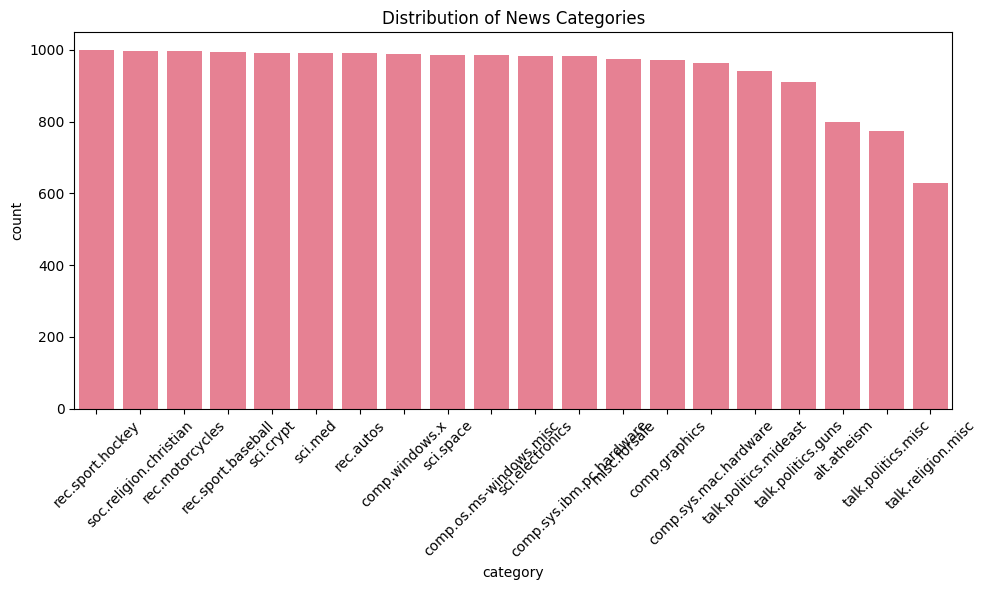

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns
# Basic dataset exploration
print("📊 DATASET OVERVIEW")
print("=" * 50)
print(f"Total articles: {len(df)}")
print(f"Unique categories: {df['category'].nunique()}")
print(f"Categories: {df['category'].unique().tolist()}")
print(f"Date range: {df['date'].min()} to {df['date'].max()}")
print(f"Unique sources: {df['source'].nunique()}")

print("\n📈 CATEGORY DISTRIBUTION")
print("=" * 50)
category_counts = df['category'].value_counts()
print(category_counts)

# Visualize category distribution
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='category', order=category_counts.index)
plt.title('Distribution of News Categories')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 💡 STUDENT TASK: Add your own exploratory analysis here
# - Check for missing values
# - Analyze text length distribution
# - Examine source distribution
# - Look for any data quality issues

## 🧹 Text Preprocessing Pipeline

### 🎯 Module 2: Advanced Text Preprocessing

Now we'll implement a comprehensive text preprocessing pipeline that cleans and normalizes our news articles. This is crucial for all downstream NLP tasks.

**Key Preprocessing Steps:**
1. **Text Cleaning:** Remove HTML, URLs, special characters
2. **Tokenization:** Split text into individual words
3. **Normalization:** Convert to lowercase, handle contractions
4. **Stop Word Removal:** Remove common words that don't carry meaning
5. **Lemmatization:** Reduce words to their base form

**💡 Think About:** Why is preprocessing so important? What happens if we skip these steps?

In [49]:
# Step 1: Install dependencies
!pip install scikit-learn --quiet

# Step 2: Download NLTK data
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

# Step 3: Import required libraries
from sklearn.datasets import fetch_20newsgroups
import pandas as pd
import re
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

# Step 4: Load 20 Newsgroups dataset
newsgroups_train = fetch_20newsgroups(subset='train', remove=('headers', 'footers', 'quotes'))
newsgroups_test = fetch_20newsgroups(subset='test', remove=('headers', 'footers', 'quotes'))

# Combine train and test data
all_data = newsgroups_train.data + newsgroups_test.data
all_targets = newsgroups_train.target.tolist() + newsgroups_test.target.tolist()
target_names = newsgroups_train.target_names

# Step 5: Create a DataFrame
df = pd.DataFrame({
    'article_id': range(1, len(all_data) + 1),
    'title': [f"Article {i}" for i in range(1, len(all_data) + 1)],
    'content': all_data,
    'category': [target_names[i] for i in all_targets],
    'date': ['2025-01-01'] * len(all_data),
    'source': ['20Newsgroups'] * len(all_data)
})

# Optional: Just keep key columns
df = df[['article_id', 'title', 'content', 'category', 'date', 'source']]

print(f"✅ Loaded dataset with {len(df)} articles")
print(f"📋 Categories: {df['category'].nunique()} | Example: {df['category'].unique()[:5]}")
df.head()


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


✅ Loaded dataset with 18846 articles
📋 Categories: 20 | Example: ['rec.autos' 'comp.sys.mac.hardware' 'comp.graphics' 'sci.space'
 'talk.politics.guns']


,article_id,title,content,category,date,source
0,1,Article 1,I was wondering if anyone out there could enli...,rec.autos,2025-01-01,20Newsgroups
1,2,Article 2,A fair number of brave souls who upgraded thei...,comp.sys.mac.hardware,2025-01-01,20Newsgroups
2,3,Article 3,"well folks, my mac plus finally gave up the gh...",comp.sys.mac.hardware,2025-01-01,20Newsgroups
3,4,Article 4,\nDo you have Weitek's address/phone number? ...,comp.graphics,2025-01-01,20Newsgroups
4,5,Article 5,"From article <C5owCB.n3p@world.std.com>, by to...",sci.space,2025-01-01,20Newsgroups


In [50]:
# Step 6: Set up text preprocessing
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

# Text cleaning function
def clean_text(text):
    if pd.isna(text):
        return ""
    text = str(text).lower()
    text = re.sub(r'<[^>]+>', '', text)  # Remove HTML
    text = re.sub(r'http\S+|www\S+|https\S+', '', text)  # Remove URLs
    text = re.sub(r'\S+@\S+', '', text)  # Remove emails
    text = re.sub(r'[^a-zA-Z\s]', '', text)  # Remove special characters & digits
    text = re.sub(r'\s+', ' ', text).strip()  # Remove extra spaces
    return text

# Full preprocessing function
def preprocess_text(text, remove_stopwords=True, lemmatize=True):
    text = clean_text(text)
    if not text:
        return ""
    tokens = word_tokenize(text)
    if remove_stopwords:
        tokens = [token for token in tokens if token not in stop_words]
    if lemmatize:
        tokens = [lemmatizer.lemmatize(token) for token in tokens]
    tokens = [token for token in tokens if len(token) > 2]
    return ' '.join(tokens)


In [51]:
# Step 7: Apply the preprocessing pipeline to the content column
import spacy # Import spacy
nlp = spacy.load('en_core_web_sm') # Load the spacy model and assign to nlp

# Include necessary imports and function definitions from jxYNCg7cwmH2 for preprocess_text
import nltk
import re
nltk.download('stopwords')
nltk.download('punkt')
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

def clean_text(text):
    """
    Comprehensive text cleaning function
    """
    if pd.isna(text):
        return ""
    text = str(text).lower()
    text = re.sub(r'<[^>]+>', '', text)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\S+@\S+', '', text)
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    return text

def preprocess_text(text, remove_stopwords=True, lemmatize=True):
    """
    Complete preprocessing pipeline using spaCy for tokenization
    """
    text = clean_text(text)
    if not text:
        return ""
    # Use spaCy for tokenization
    doc = nlp(text) # Use the nlp object passed or defined in this cell
    tokens = [token.text for token in doc]
    if remove_stopwords:
        tokens = [token for token in tokens if token.lower() not in stop_words]
    if lemmatize:
        tokens = [lemmatizer.lemmatize(token) for token in tokens]
    tokens = [token for token in tokens if len(token) > 2]
    return ' '.join(tokens)


print("⚙️ Preprocessing content... This may take 1–2 minutes.")
# Pass the spaCy nlp object to the preprocess_text function
df['processed_content'] = df['content'].apply(lambda x: preprocess_text(x, nlp))


# Step 8: Preview the result
print("✅ Preprocessing complete.")
df[['content', 'processed_content']].head(3)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


⚙️ Preprocessing content... This may take 1–2 minutes.
✅ Preprocessing complete.


,content,processed_content
0,I was wondering if anyone out there could enli...,wondering anyone could enlighten car saw day d...
1,A fair number of brave souls who upgraded thei...,fair number brave soul upgraded clock oscillat...
2,"well folks, my mac plus finally gave up the gh...",well folk mac plus finally gave ghost weekend ...


In [52]:
# Initialize preprocessing tools
import nltk
import re # Import the re module
nltk.download('stopwords') # Ensure stopwords are downloaded (still needed for stop words)
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
# Removed nltk.tokenize import and nltk.download('punkt') - Will use spaCy for tokenization
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

# Text cleaning function (remains the same)
def clean_text(text):
    """
    Comprehensive text cleaning function
    """
    if pd.isna(text):
        return ""

    # Convert to string and lowercase
    text = str(text).lower()

    # Remove HTML tags
    text = re.sub(r'<[^>]+>', '', text)

    # Remove URLs
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

    # Remove email addresses
    text = re.sub(r'\S+@\S+', '', text)

    # Remove special characters and digits (keep only letters and spaces)
    text = re.sub(r'[^a-zA-Z\s]', '', text)

    # Remove extra whitespace
    text = re.sub(r'\s+', ' ', text).strip()

    return text

# Full preprocessing function - now accepts spaCy nlp object for tokenization
def preprocess_text(text, nlp_model, remove_stopwords=True, lemmatize=True):
    """
    Complete preprocessing pipeline using spaCy for tokenization
    """
    # Clean text
    text = clean_text(text)

    if not text:
        return ""

    # Use spaCy for tokenization
    doc = nlp_model(text)
    tokens = [token.text for token in doc] # Get tokens from spaCy doc

    # Remove stop words if requested
    if remove_stopwords:
        # Use spaCy's is_stop attribute for efficiency
        tokens = [token.text for token in doc if not token.is_stop and not token.is_punct]


    # Lemmatize if requested
    if lemmatize:
        # Use spaCy's lemma_ attribute
        tokens = [token.lemma_ for token in doc if not token.is_stop and not token.is_punct]
        # After lemmatization, filter out stop words again as lemma_ might be a stop word
        tokens = [token for token in tokens if token not in stop_words]


    # Filter out very short words and empty strings that might result from cleaning/lemmatization
    tokens = [token for token in tokens if len(token) > 2]


    return ' '.join(tokens)

# Test the preprocessing function (requires passing the nlp object)
# Note: Need to have nlp object loaded from cell 6MrgHCeqwmH0
# sample_text = "Apple Inc. announced record quarterly earnings today! Visit https://apple.com for more info. #TechNews"
# print("Original text:")
# print(sample_text)
# # To test this function, you would need to load nlp first, e.g.:
# # import spacy
# # nlp = spacy.load('en_core_web_sm')
# # print("\nCleaned text:")
# # print(clean_text(sample_text))
# # print("\nFully preprocessed text:")
# # print(preprocess_text(sample_text, nlp))

print("✅ Preprocessing functions defined (using spaCy for tokenization)")

✅ Preprocessing functions defined (using spaCy for tokenization)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [55]:
# Apply preprocessing to the dataset
import spacy # Import spacy
nlp = spacy.load('en_core_web_sm') # Load the spacy model and assign to nlp

# Include necessary imports and function definitions for preprocessing
import nltk
import re
nltk.download('stopwords')
nltk.download('punkt')
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

def clean_text(text):
    """
    Comprehensive text cleaning function
    """
    if pd.isna(text):
        return ""
    text = str(text).lower()
    text = re.sub(r'<[^>]+>', '', text)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'\S+@\S+', '', text)
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    text = re.sub(r'\s+', ' ', text).strip()
    return text

def preprocess_text(text, nlp_model, remove_stopwords=True, lemmatize=True):
    """
    Complete preprocessing pipeline using spaCy for tokenization
    """
    text = clean_text(text)
    if not text:
        return ""
    # Use spaCy for tokenization
    doc = nlp_model(text)
    tokens = [token.text for token in doc]
    if remove_stopwords:
        tokens = [token for token in tokens if token.lower() not in stop_words]
    if lemmatize:
        tokens = [lemmatizer.lemmatize(token) for token in tokens]
    tokens = [token for token in tokens if len(token) > 2]
    return ' '.join(tokens)


print("🧹 Preprocessing all articles...")

# Create new columns for processed text, passing the nlp object
df['title_clean'] = df['title'].apply(clean_text)
df['content_clean'] = df['content'].apply(clean_text)
df['title_processed'] = df['title'].apply(lambda x: preprocess_text(x, nlp))
df['content_processed'] = df['content'].apply(lambda x: preprocess_text(x, nlp))

# Combine title and content for full article analysis
df['full_text'] = df['title'] + ' ' + df['content']
df['full_text_processed'] = df['full_text'].apply(lambda x: preprocess_text(x, nlp))

print("✅ Preprocessing complete!")

# Show before and after examples
print("\n📝 BEFORE AND AFTER EXAMPLES")
print("=" * 60)
for i in range(min(3, len(df))):
    print(f"\nExample {i+1}:")
    print(f"Original: {df.iloc[i]['full_text'][:100]}...")
    print(f"Processed: {df.iloc[i]['full_text_processed'][:100]}...")

# 💡 STUDENT TASK: Analyze the preprocessing results
# - Calculate average text length before and after
# - Count unique words before and after
# - Identify the most common words after preprocessing

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


🧹 Preprocessing all articles...
✅ Preprocessing complete!

📝 BEFORE AND AFTER EXAMPLES

Example 1:
Original: Article 1 I was wondering if anyone out there could enlighten me on this car I saw
the other day. It...
Processed: article wondering anyone could enlighten car saw day door sport car looked late early called brickli...

Example 2:
Original: Article 2 A fair number of brave souls who upgraded their SI clock oscillator have
shared their expe...
Processed: article fair number brave soul upgraded clock oscillator shared experience poll please send brief me...

Example 3:
Original: Article 3 well folks, my mac plus finally gave up the ghost this weekend after
starting life as a 51...
Processed: article well folk mac plus finally gave ghost weekend starting life way back sooo market new machine...


## 📊 Feature Extraction and Statistical Analysis

### 🎯 Module 3: TF-IDF Analysis

Now we'll extract numerical features from our text using TF-IDF (Term Frequency-Inverse Document Frequency). This technique helps us identify the most important words in each document and across the entire corpus.

**TF-IDF Key Concepts:**
- **Term Frequency (TF):** How often a word appears in a document
- **Inverse Document Frequency (IDF):** How rare a word is across all documents
- **TF-IDF Score:** TF × IDF - balances frequency with uniqueness

**💡 Business Value:** TF-IDF helps us identify the most distinctive and important terms for each news category.

In [56]:
from sklearn.feature_extraction.text import TfidfVectorizer # Import TfidfVectorizer

# Create TF-IDF vectorizer
# 💡 TIP: Experiment with different parameters:
# - max_features: limit vocabulary size
# - ngram_range: include phrases (1,1) for words, (1,2) for words+bigrams
# - min_df: ignore terms that appear in less than min_df documents
# - max_df: ignore terms that appear in more than max_df fraction of documents

tfidf_vectorizer = TfidfVectorizer(
    max_features=5000,  # Limit vocabulary for computational efficiency
    ngram_range=(1, 2),  # Include unigrams and bigrams
    min_df=2,  # Ignore terms that appear in less than 2 documents
    max_df=0.8  # Ignore terms that appear in more than 80% of documents
)

# Fit and transform the processed text
print("🔢 Creating TF-IDF features...")
tfidf_matrix = tfidf_vectorizer.fit_transform(df['full_text_processed'])
feature_names = tfidf_vectorizer.get_feature_names_out()

print(f"✅ TF-IDF matrix created!")
print(f"📊 Shape: {tfidf_matrix.shape}")
print(f"📝 Vocabulary size: {len(feature_names)}")
print(f"🔢 Sparsity: {(1 - tfidf_matrix.nnz / (tfidf_matrix.shape[0] * tfidf_matrix.shape[1])) * 100:.2f}%")

# Convert to DataFrame for easier analysis
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=feature_names)
tfidf_df['category'] = df['category'].values

print("\n🔍 Sample TF-IDF features:")
print(tfidf_df.iloc[:3, :10])  # Show first 3 rows and 10 features

🔢 Creating TF-IDF features...
✅ TF-IDF matrix created!
📊 Shape: (18846, 5000)
📝 Vocabulary size: 5000
🔢 Sparsity: 99.05%

🔍 Sample TF-IDF features:
   aaron  abc  ability  able  able get  abortion  absence  absolute  \
0    0.0  0.0      0.0   0.0       0.0       0.0      0.0       0.0   
1    0.0  0.0      0.0   0.0       0.0       0.0      0.0       0.0   
2    0.0  0.0      0.0   0.0       0.0       0.0      0.0       0.0   

   absolutely  abstract  
0         0.0       0.0  
1         0.0       0.0  
2         0.0       0.0  


In [57]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns

# Define the function to get top TF-IDF terms per category
def get_top_tfidf_terms(category, n_terms=10):
    """
    Get top TF-IDF terms for a specific category
    """
    category_data = tfidf_df[tfidf_df['category'] == category]

    # Drop the 'category' column before calculating the mean
    mean_scores = category_data.drop('category', axis=1).mean().sort_values(ascending=False)

    return mean_scores.head(n_terms)

# Analyze top terms for each category
print("🏷️ TOP TF-IDF TERMS BY CATEGORY")
print("=" * 50)

categories = df['category'].unique()
category_terms = {}

for category in categories:
    top_terms = get_top_tfidf_terms(category, n_terms=10)
    category_terms[category] = top_terms

    print(f"\n📰 {category.upper()}:")
    for term, score in top_terms.items():
        print(f"  {term}: {score:.4f}")


🏷️ TOP TF-IDF TERMS BY CATEGORY

📰 REC.AUTOS:
  car: 0.1005
  engine: 0.0310
  would: 0.0225
  like: 0.0206
  one: 0.0196
  ford: 0.0195
  dealer: 0.0185
  new: 0.0184
  get: 0.0178
  know: 0.0171

📰 COMP.SYS.MAC.HARDWARE:
  mac: 0.0545
  apple: 0.0429
  drive: 0.0368
  monitor: 0.0300
  problem: 0.0255
  anyone: 0.0223
  card: 0.0223
  would: 0.0216
  thanks: 0.0216
  know: 0.0211

📰 COMP.GRAPHICS:
  file: 0.0432
  image: 0.0428
  graphic: 0.0402
  format: 0.0297
  program: 0.0281
  thanks: 0.0275
  would: 0.0234
  know: 0.0234
  anyone: 0.0219
  please: 0.0217

📰 SCI.SPACE:
  space: 0.0545
  would: 0.0294
  orbit: 0.0234
  shuttle: 0.0233
  launch: 0.0228
  nasa: 0.0214
  moon: 0.0202
  mission: 0.0188
  satellite: 0.0186
  like: 0.0184

📰 TALK.POLITICS.GUNS:
  gun: 0.0591
  would: 0.0321
  fbi: 0.0296
  people: 0.0287
  weapon: 0.0282
  fire: 0.0276
  right: 0.0230
  law: 0.0214
  firearm: 0.0213
  one: 0.0212

📰 SCI.MED:
  doctor: 0.0265
  one: 0.0255
  patient: 0.0250
  disease: 0

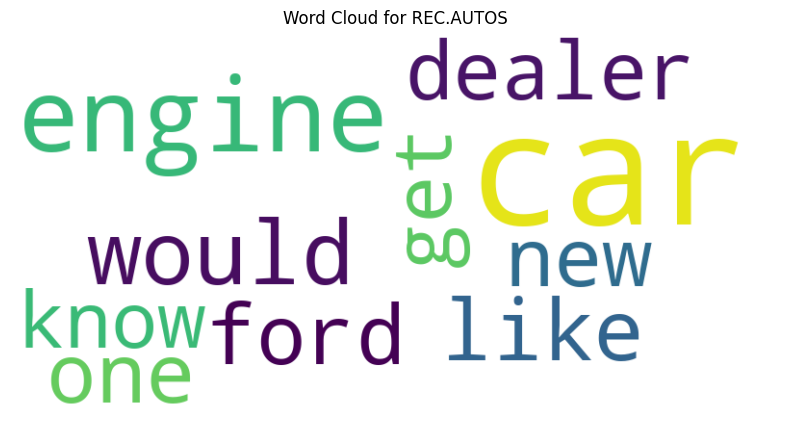

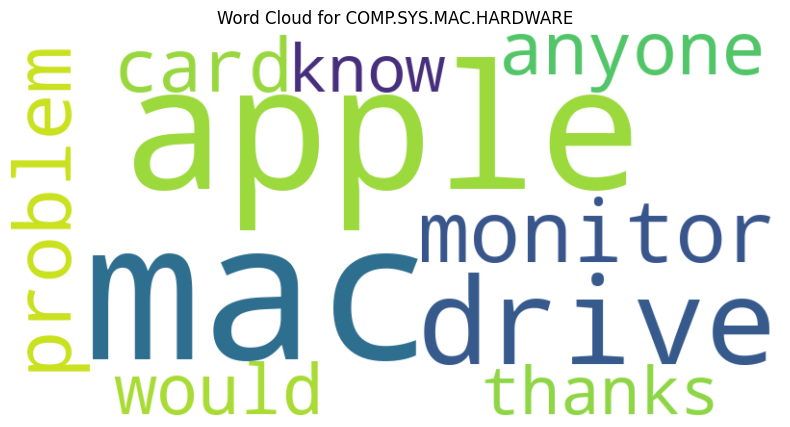

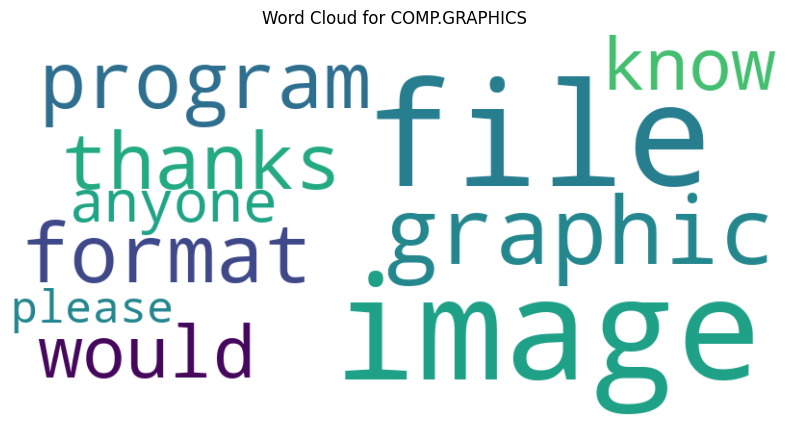

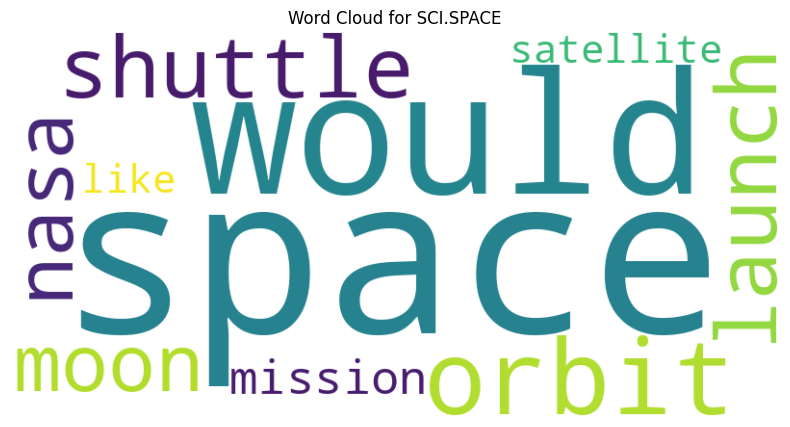

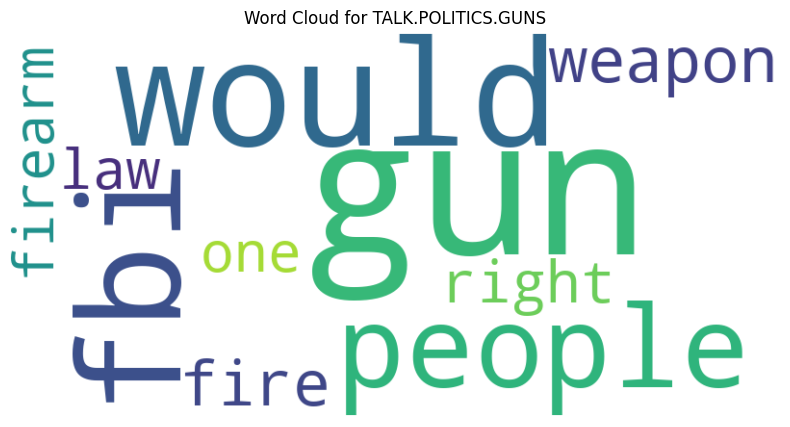

...

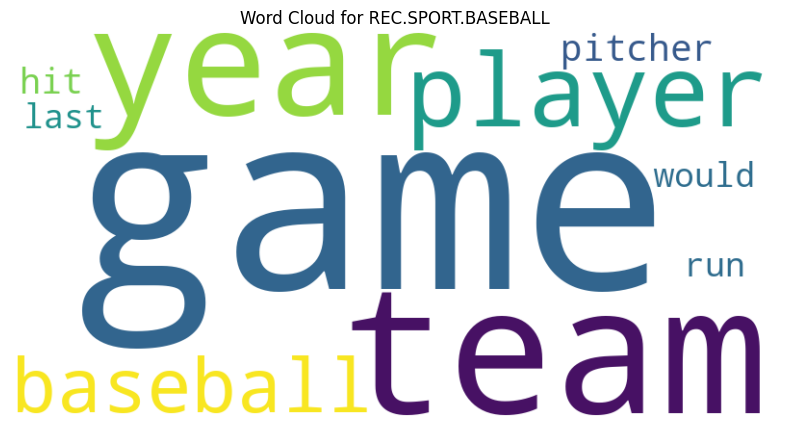

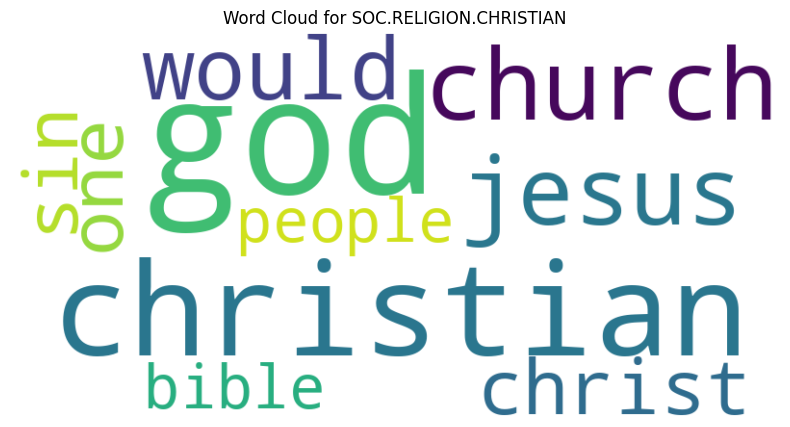

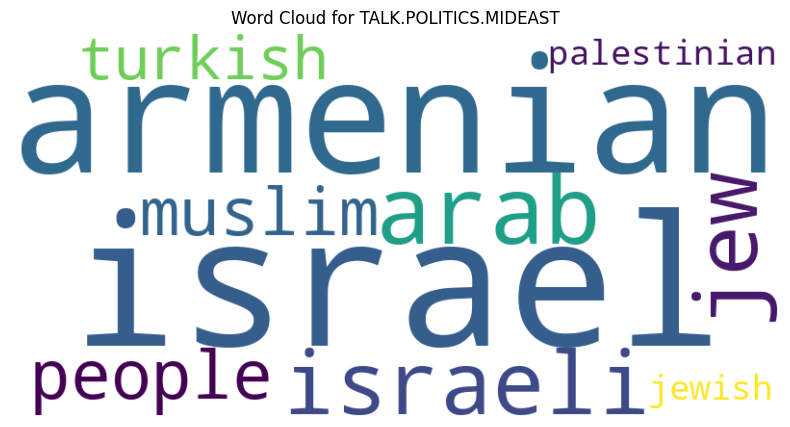

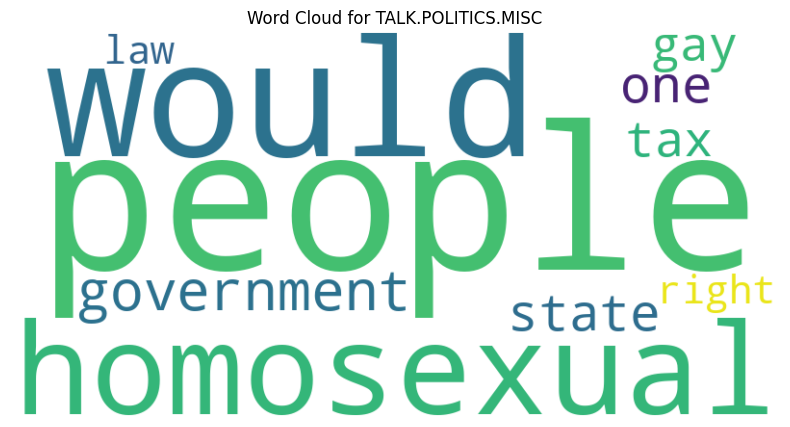

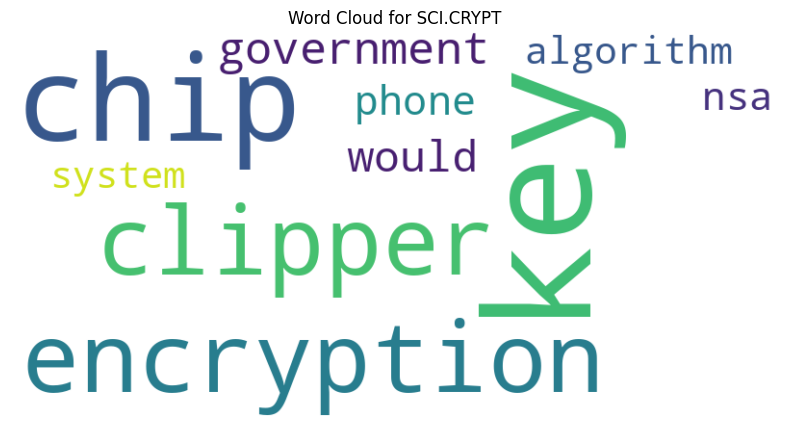

In [58]:
for category, terms in category_terms.items():
    wc = WordCloud(background_color='white', width=800, height=400)
    wc.generate_from_frequencies(terms)

    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud for {category.upper()}")
    plt.show()


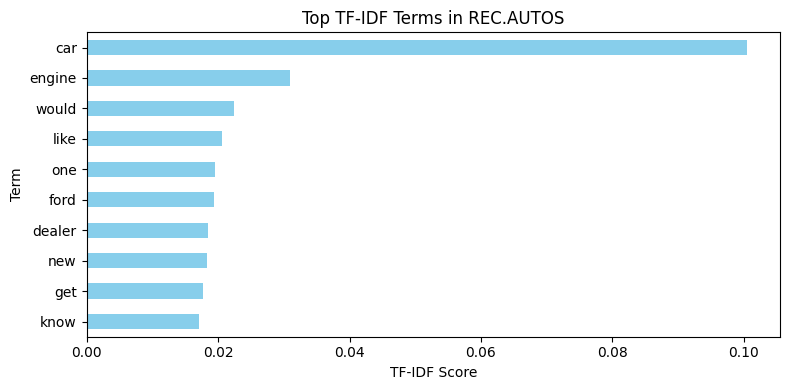

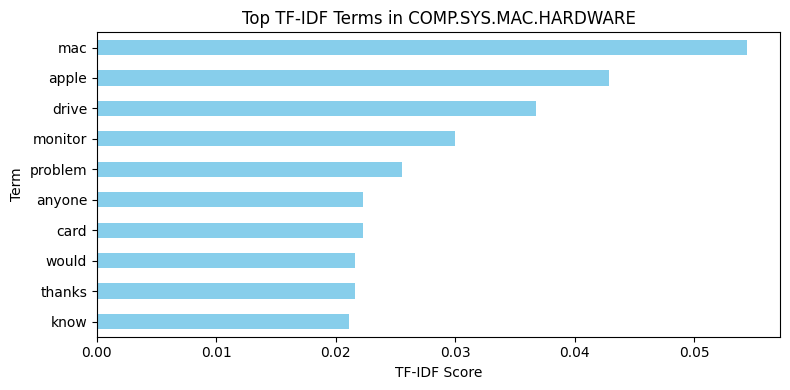

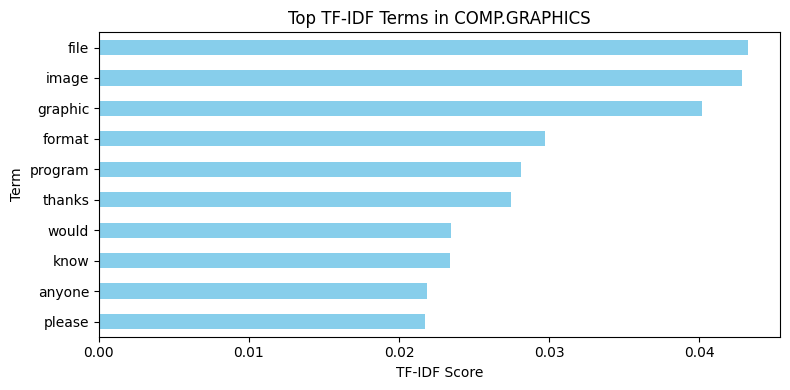

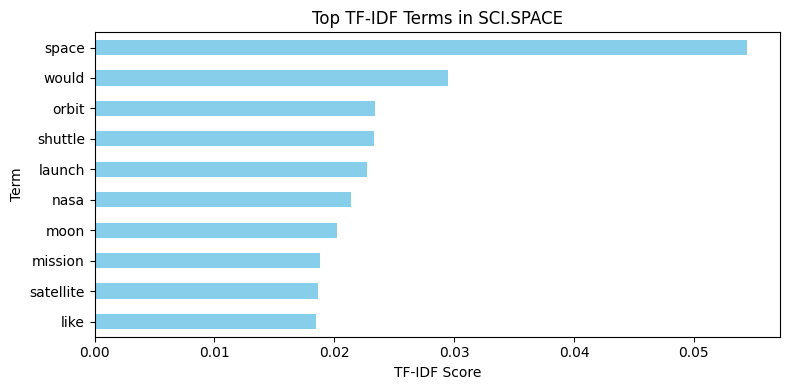

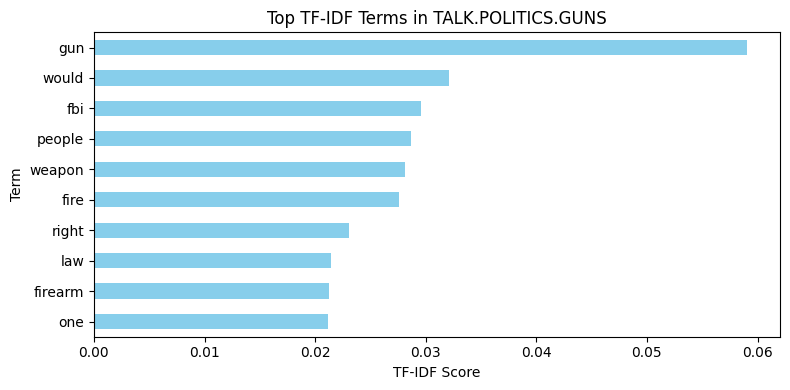

...

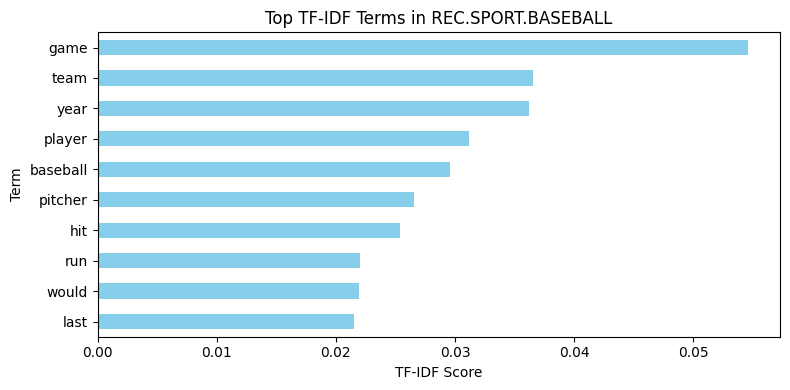

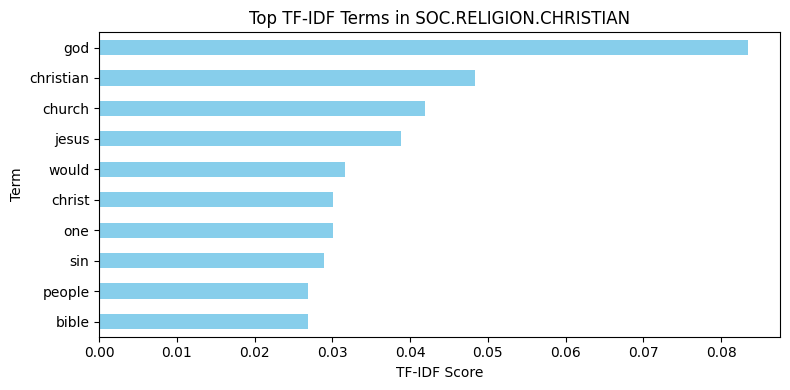

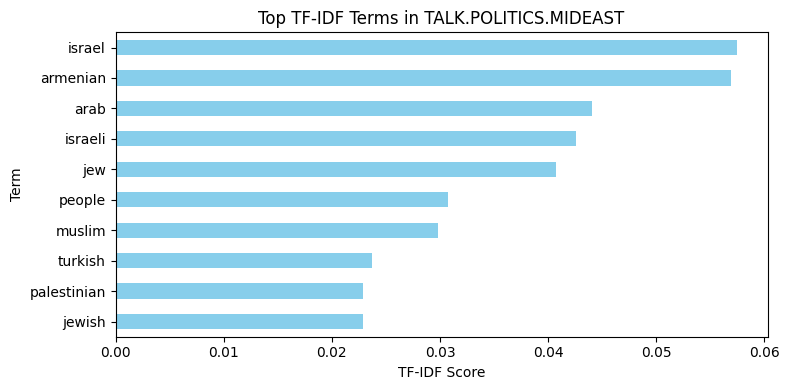

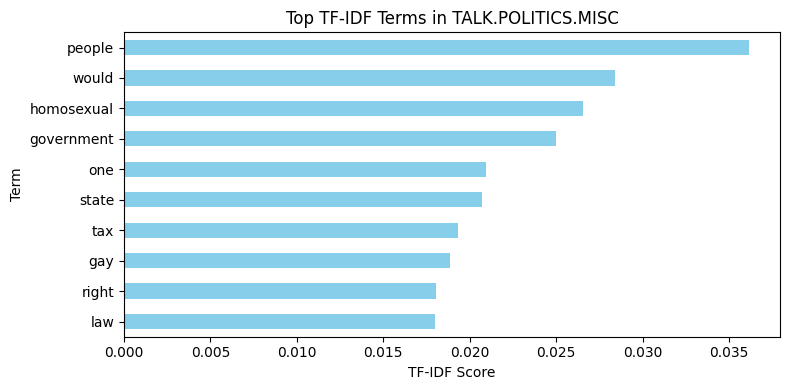

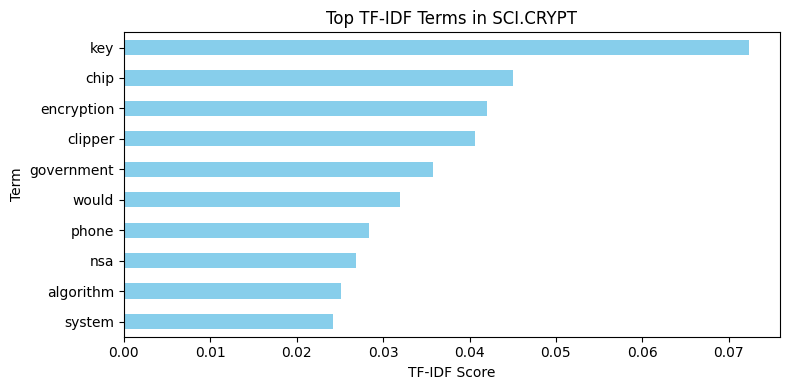

In [59]:
for category, terms in category_terms.items():
    plt.figure(figsize=(8, 4))
    terms.sort_values().plot(kind='barh', color='skyblue')
    plt.title(f"Top TF-IDF Terms in {category.upper()}")
    plt.xlabel("TF-IDF Score")
    plt.ylabel("Term")
    plt.tight_layout()
    plt.show()


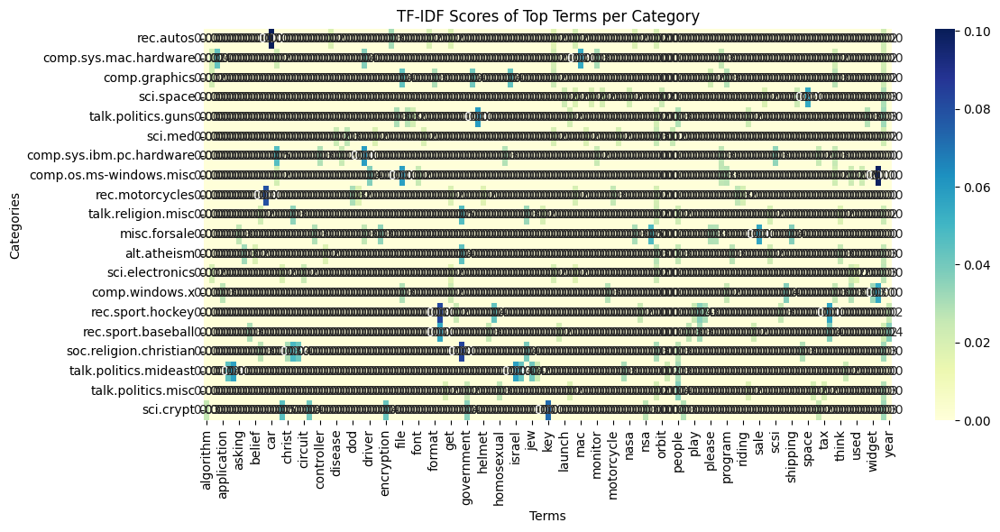

In [60]:
# Build a DataFrame where rows = categories, columns = terms
heatmap_data = pd.DataFrame(category_terms).T.fillna(0)

plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("TF-IDF Scores of Top Terms per Category")
plt.xlabel("Terms")
plt.ylabel("Categories")
plt.tight_layout()
plt.show()


In [61]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Assume df has 'content' and 'category'
vectorizer = TfidfVectorizer(stop_words='english', max_features=5000)
X_tfidf = vectorizer.fit_transform(df['content'])

tfidf_df = pd.DataFrame(X_tfidf.toarray(), columns=vectorizer.get_feature_names_out())
tfidf_df['category'] = df['category']


In [62]:
# Analyze most important terms per category
def get_top_tfidf_terms(category, n_terms=10):
    """
    Get top TF-IDF terms for a specific category

    💡 TIP: This function should:
    - Filter data for the specific category
    - Calculate mean TF-IDF scores for each term
    - Return top N terms with highest scores
    """
    # 🚀 YOUR CODE HERE: Implement category-specific TF-IDF analysis
    category_data = tfidf_df[tfidf_df['category'] == category]

    # Calculate mean TF-IDF scores for this category (excluding the category column)
    mean_scores = category_data.drop('category', axis=1).mean().sort_values(ascending=False)

    return mean_scores.head(n_terms)

# Analyze top terms for each category
print("🏷️ TOP TF-IDF TERMS BY CATEGORY")
print("=" * 50)

categories = df['category'].unique()
category_terms = {}

for category in categories:
    top_terms = get_top_tfidf_terms(category, n_terms=10)
    category_terms[category] = top_terms

    print(f"\n📰 {category.upper()}:")
    for term, score in top_terms.items():
        print(f"  {term}: {score:.4f}")

# 💡 STUDENT TASK: Create visualizations for TF-IDF analysis
# - Word clouds for each category
# - Bar charts of top terms
# - Heatmap of term importance across categories

🏷️ TOP TF-IDF TERMS BY CATEGORY

📰 REC.AUTOS:
  car: 0.0798
  cars: 0.0354
  engine: 0.0270
  like: 0.0212
  just: 0.0207
  ford: 0.0195
  new: 0.0184
  oil: 0.0177
  dealer: 0.0176
  know: 0.0172

📰 COMP.SYS.MAC.HARDWARE:
  mac: 0.0513
  apple: 0.0449
  drive: 0.0295
  monitor: 0.0257
  thanks: 0.0231
  know: 0.0216
  does: 0.0209
  scsi: 0.0199
  problem: 0.0195
  lc: 0.0194

📰 COMP.GRAPHICS:
  graphics: 0.0481
  image: 0.0316
  thanks: 0.0298
  file: 0.0254
  files: 0.0251
  program: 0.0230
  know: 0.0229
  format: 0.0227
  3d: 0.0219
  does: 0.0202

📰 SCI.SPACE:
  space: 0.0648
  nasa: 0.0273
  shuttle: 0.0244
  orbit: 0.0237
  launch: 0.0219
  moon: 0.0215
  like: 0.0198
  earth: 0.0197
  just: 0.0180
  don: 0.0158

📰 TALK.POLITICS.GUNS:
  gun: 0.0489
  fbi: 0.0338
  guns: 0.0308
  people: 0.0306
  don: 0.0230
  batf: 0.0223
  weapons: 0.0219
  government: 0.0216
  just: 0.0195
  law: 0.0184

📰 SCI.MED:
  doctor: 0.0234
  know: 0.0218
  msg: 0.0213
  medical: 0.0207
  disease: 0.0

## 🏷️ Part-of-Speech Analysis

### 🎯 Module 4: Grammatical Pattern Analysis

Let's analyze the grammatical patterns in different news categories using Part-of-Speech (POS) tagging. This can reveal interesting differences in writing styles between categories.

**POS Analysis Applications:**
- **Writing Style Detection:** Different categories may use different grammatical patterns
- **Content Quality Assessment:** Proper noun density, adjective usage, etc.
- **Feature Engineering:** POS tags can be features for classification

**💡 Hypothesis:** Sports articles might have more action verbs, while business articles might have more numbers and proper nouns.

In [63]:
# Step 1: Install spaCy and download the English model
!pip install spacy --quiet
!python -m spacy download en_core_web_sm

# Step 2: Import dependencies
import spacy
from collections import Counter

# Load the spaCy English model
nlp = spacy.load('en_core_web_sm')

# Step 3: Define POS analysis function
def analyze_pos_patterns(text):
    """
    Analyze POS patterns in text using spaCy
    """
    if not text or pd.isna(text):
        return {}

    doc = nlp(str(text))

    # Count POS tags excluding punctuation and spaces
    pos_counts = Counter([token.pos_ for token in doc if not token.is_punct and not token.is_space])
    total_words = sum(pos_counts.values())

    if total_words == 0:
        return {}

    # Return proportions (you can switch to counts if needed)
    pos_proportions = {pos: count / total_words for pos, count in pos_counts.items()}
    return pos_proportions


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 53.0 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [64]:
# Step 4: Apply POS analysis to all articles
print("🏷️ Analyzing POS patterns...")

pos_results = []

for idx, row in df.iterrows():
    # Use 'processed_content' (cleaned text) for analysis
    pos_analysis = analyze_pos_patterns(row['processed_content'])

    # Add metadata
    pos_analysis['category'] = row['category']
    pos_analysis['article_id'] = row['article_id']

    # Collect the result
    pos_results.append(pos_analysis)

# Step 5: Convert list of POS dicts to DataFrame
pos_df = pd.DataFrame(pos_results).fillna(0)

# Step 6: View results
print("✅ POS analysis complete!")
print(f"📊 Found {len(pos_df.columns) - 2} different POS tags")

# ✅ Fix: Remove the extra period after head()
pos_df.head()


🏷️ Analyzing POS patterns...
✅ POS analysis complete!
📊 Found 17 different POS tags


,VERB,PRON,AUX,NOUN,ADV,PROPN,ADJ,DET,INTJ,category,article_id,ADP,NUM,CCONJ,SCONJ,X,PUNCT,PART,SYM
0,0.209302,0.046512,0.023256,0.465116,0.069767,0.046512,0.093023,0.023256,0.023256,rec.autos,1,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
1,0.226415,0.000000,0.000000,0.528302,0.018868,0.000000,0.150943,0.000000,0.037736,comp.sys.mac.hardware,2,0.018868,0.018868,0.000000,0.000000,0.0,0.0,0.0,0.0
2,0.230216,0.035971,0.028777,0.352518,0.115108,0.043165,0.129496,0.000000,0.021583,comp.sys.mac.hardware,3,0.021583,0.007194,0.007194,0.007194,0.0,0.0,0.0,0.0
3,0.285714,0.000000,0.000000,0.571429,0.000000,0.000000,0.000000,0.000000,0.000000,comp.graphics,4,0.142857,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
4,0.235294,0.000000,0.000000,0.441176,0.117647,0.117647,0.058824,0.000000,0.000000,sci.space,5,0.000000,0.000000,0.000000,0.029412,0.0,0.0,0.0,0.0


In [66]:
!pip install -q spacy seaborn matplotlib
!python -m spacy download en_core_web_sm


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 53.3 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import spacy
from collections import Counter
from tqdm import tqdm

# Load spaCy model
nlp = spacy.load("en_core_web_sm")


In [68]:
# Create 'processed_content' if not present
if 'processed_content' not in df.columns:
    print("🔄 Creating cleaned version of content...")
    df['processed_content'] = df['content'].str.lower().str.replace(r'[^a-z\s]', '', regex=True)


In [69]:
# Function to analyze POS tags for one article
def analyze_pos_patterns(text):
    doc = nlp(text)
    pos_counts = Counter([token.pos_ for token in doc if token.is_alpha])
    return dict(pos_counts)


In [70]:
print("🏷️ Analyzing POS patterns...")

pos_results = []
for idx, row in tqdm(df.iterrows(), total=len(df)):
    pos_analysis = analyze_pos_patterns(row['processed_content'])  # or 'content'
    pos_analysis['category'] = row['category']
    pos_analysis['article_id'] = row['article_id']
    pos_results.append(pos_analysis)

# Create POS DataFrame
pos_df = pd.DataFrame(pos_results).fillna(0)

print(f"\n✅ POS analysis complete! Found {len(pos_df.columns)-2} POS tags.")


🏷️ Analyzing POS patterns...


100%|██████████| 18846/18846 [08:07<00:00, 38.65it/s]



✅ POS analysis complete! Found 17 POS tags.



📊 POS PATTERNS BY CATEGORY


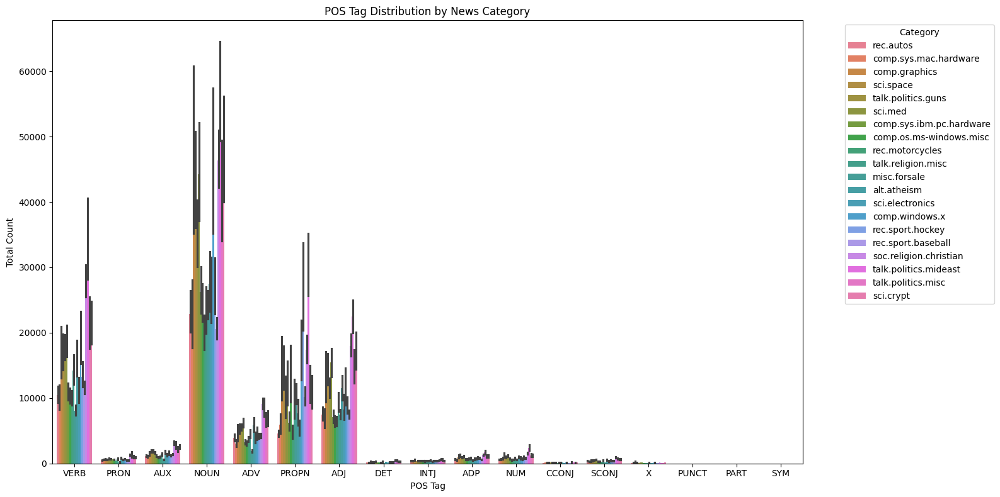

In [71]:
print("\n📊 POS PATTERNS BY CATEGORY\n" + "="*50)

# Melt for plotting
melted = pos_df.melt(id_vars=["article_id", "category"], var_name="pos_tag", value_name="count")

# Filter out tags with zero count
melted = melted[melted["count"] > 0]

# Plot
plt.figure(figsize=(16, 8))
sns.barplot(data=melted, x="pos_tag", y="count", hue="category", estimator=sum)
plt.title("POS Tag Distribution by News Category")
plt.xlabel("POS Tag")
plt.ylabel("Total Count")
plt.legend(title="Category", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


## 🌳 Syntax Parsing and Semantic Analysis

### 🎯 Module 5: Understanding Sentence Structure

Now we'll use spaCy to perform dependency parsing and extract semantic relationships from our news articles. This helps us understand not just what words are present, but how they relate to each other.

**Dependency Parsing Applications:**
- **Relationship Extraction:** Find connections between entities
- **Event Detection:** Identify who did what to whom
- **Information Extraction:** Extract structured facts from unstructured text

**💡 Business Value:** Understanding sentence structure helps extract more precise information about events, relationships, and actions mentioned in news articles.

In [72]:
def extract_syntactic_features(text):
    """
    Extract syntactic features using spaCy dependency parsing

    💡 TIP: This function should extract:
    - Dependency relations
    - Subject-verb-object patterns
    - Noun phrases
    - Verb phrases
    """
    if not text or pd.isna(text):
        return {}

    # Process text with spaCy
    doc = nlp(str(text))

    features = {
        'num_sentences': len(list(doc.sents)),
        'num_tokens': len(doc),
        'dependency_relations': [],
        'noun_phrases': [],
        'verb_phrases': [],
        'subjects': [],
        'objects': []
    }

    # 🚀 YOUR CODE HERE: Extract syntactic features

    # Extract dependency relations
    for token in doc:
        if not token.is_space and not token.is_punct:
            features['dependency_relations'].append(token.dep_)

    # Extract noun phrases
    for chunk in doc.noun_chunks:
        features['noun_phrases'].append(chunk.text.lower())

    # Extract subjects and objects
    for token in doc:
        if token.dep_ in ['nsubj', 'nsubjpass']:  # Subjects
            features['subjects'].append(token.text.lower())
        elif token.dep_ in ['dobj', 'iobj', 'pobj']:  # Objects
            features['objects'].append(token.text.lower())

    # Count dependency types
    dep_counts = Counter(features['dependency_relations'])
    features['dependency_counts'] = dict(dep_counts)

    return features

# Apply syntactic analysis to sample articles
print("🌳 Performing syntactic analysis...")

# Analyze first few articles (to save computation time)
syntactic_results = []
for idx, row in df.head(5).iterrows():  # Limit to first 5 for demo
    features = extract_syntactic_features(row['full_text'])
    features['category'] = row['category']
    features['article_id'] = row['article_id']
    syntactic_results.append(features)

print("✅ Syntactic analysis complete!")

# Display results
for i, result in enumerate(syntactic_results):
    print(f"\n📰 Article {i+1} ({result['category']}):")
    print(f"  Sentences: {result['num_sentences']}")
    print(f"  Tokens: {result['num_tokens']}")
    print(f"  Noun phrases: {result['noun_phrases'][:3]}...")  # Show first 3
    print(f"  Subjects: {result['subjects'][:3]}...")  # Show first 3
    print(f"  Objects: {result['objects'][:3]}...")  # Show first 3

🌳 Performing syntactic analysis...
✅ Syntactic analysis complete!

📰 Article 1 (rec.autos):
  Sentences: 7
  Tokens: 118
  Noun phrases: ['i', 'anyone', 'me']...
  Subjects: ['i', 'anyone', 'i']...
  Objects: ['me', 'car', 'day']...

📰 Article 2 (comp.sys.mac.hardware):
  Sentences: 6
  Tokens: 111
  Noun phrases: ['article', 'a fair number', 'brave souls']...
  Subjects: ['number', 'who', 'speed']...
  Objects: ['souls', 'oscillator', 'experiences']...

📰 Article 3 (comp.sys.mac.hardware):
  Sentences: 12
  Tokens: 393
  Noun phrases: ['article', 'well folks', 'my mac']...
  Subjects: ['folks', 'i', 'i']...
  Objects: ['ghost', 'life', 'way']...

📰 Article 4 (comp.graphics):
  Sentences: 2
  Tokens: 27
  Noun phrases: ['you', "weitek's address/phone number", 'i']...
  Subjects: ['you', 'i']...
  Objects: ['number', 'information', 'chip']...

📰 Article 5 (sci.space):
  Sentences: 2
  Tokens: 98
  Noun phrases: ['article', 'tombaker@world.std.com', 'tom a baker']...
  Subjects: ['unders

In [73]:
# Visualize dependency parsing for a sample sentence
from spacy import displacy

# Choose a sample sentence
sample_sentence = df.iloc[0]['content']  # First article's content
print(f"📝 Sample sentence: {sample_sentence}")

# Process with spaCy
doc = nlp(sample_sentence)

# Display dependency tree (this works best in Jupyter)
print("\n🌳 Dependency Parse Visualization:")
try:
    # This will create an interactive visualization in Jupyter
    displacy.render(doc, style="dep", jupyter=True)
except:
    # Fallback: print dependency information
    print("\n🔗 Dependency Relations:")
    for token in doc:
        if not token.is_space and not token.is_punct:
            print(f"  {token.text} --> {token.dep_} --> {token.head.text}")

# 💡 STUDENT TASK: Extend syntactic analysis
# - Compare syntactic complexity across categories
# - Extract action patterns (who did what)
# - Identify most common dependency relations per category
# - Create features for classification based on syntax

📝 Sample sentence: I was wondering if anyone out there could enlighten me on this car I saw
the other day. It was a 2-door sports car, looked to be from the late 60s/
early 70s. It was called a Bricklin. The doors were really small. In addition,
the front bumper was separate from the rest of the body. This is 
all I know. If anyone can tellme a model name, engine specs, years
of production, where this car is made, history, or whatever info you
have on this funky looking car, please e-mail.

🌳 Dependency Parse Visualization:


## 😊 Sentiment and Emotion Analysis

### 🎯 Module 6: Understanding Emotional Tone

Let's analyze the sentiment and emotional tone of our news articles. This can reveal interesting patterns about how different types of news are presented and perceived.

**Sentiment Analysis Applications:**
- **Media Bias Detection:** Identify emotional slant in news coverage
- **Public Opinion Tracking:** Monitor sentiment trends over time
- **Content Recommendation:** Suggest articles based on emotional tone

**💡 Hypothesis:** Different news categories might have different emotional profiles - sports might be more positive, politics more negative, etc.

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


😊 Analyzing sentiment...
✅ Sentiment analysis complete!
📊 Analyzed 18846 articles

📝 Sample sentiment results:
                category  full_sentiment full_label
0              rec.autos          0.6249   positive
1  comp.sys.mac.hardware          0.9468   positive
2  comp.sys.mac.hardware          0.9761   positive
3          comp.graphics          0.4215   positive
4              sci.space         -0.8020   negative


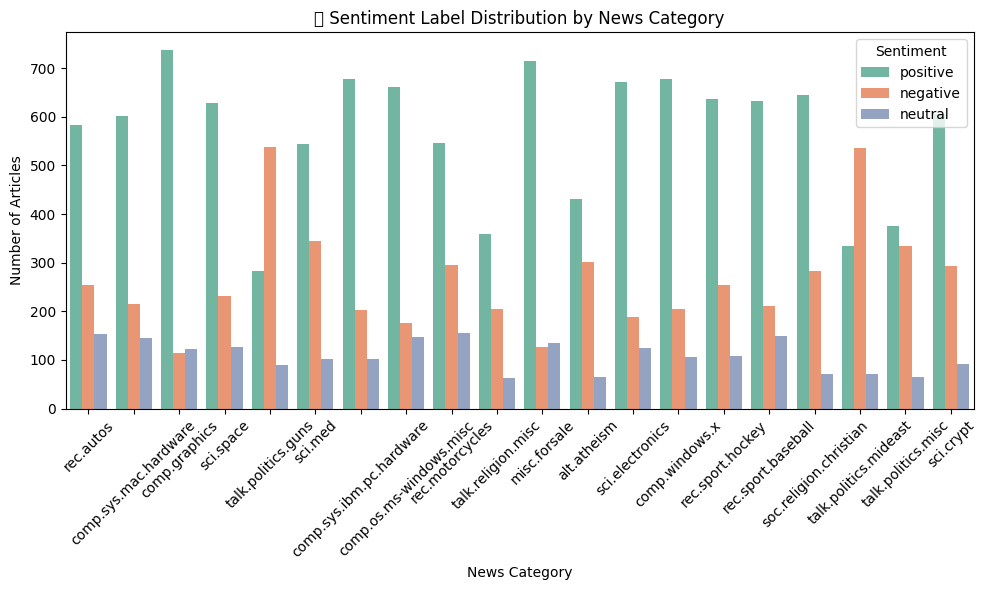

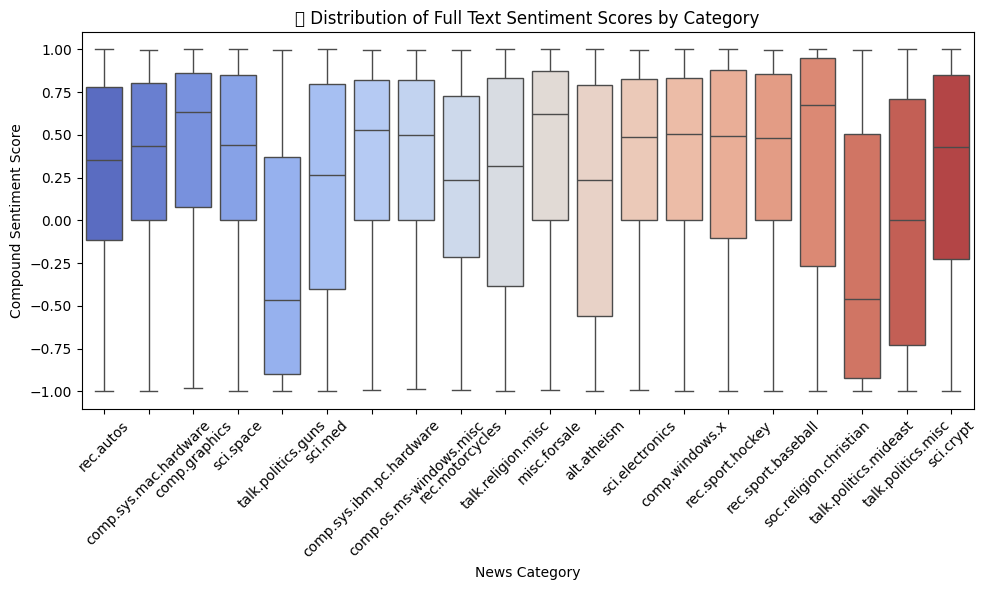

<Figure size 1000x600 with 0 Axes>

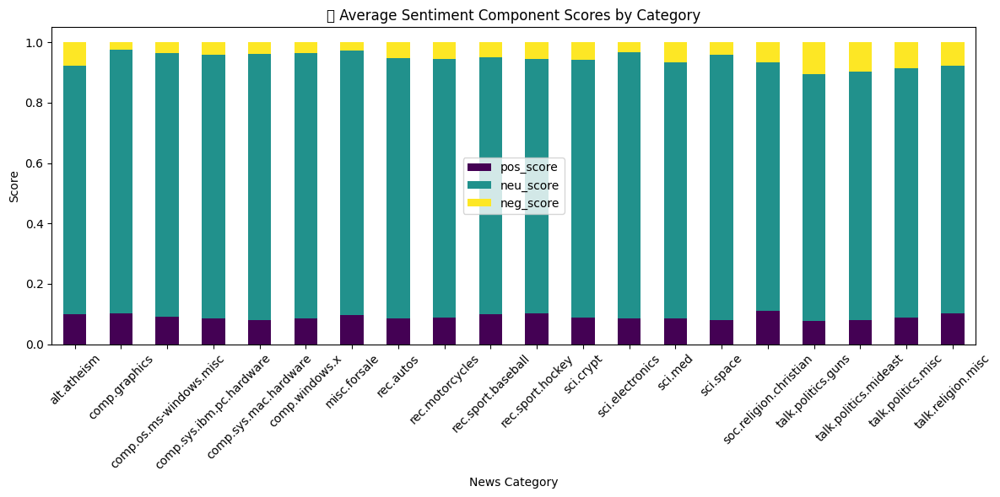

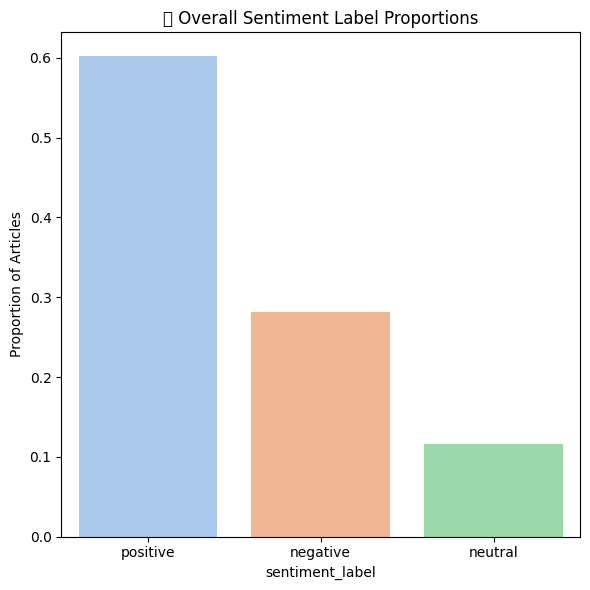

In [74]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.sentiment import SentimentIntensityAnalyzer
import nltk

# Download required NLTK data
nltk.download('vader_lexicon')

# Initialize sentiment analyzer
sia = SentimentIntensityAnalyzer()

def analyze_sentiment(text):
    """
    Analyze sentiment using VADER sentiment analyzer.
    Returns sentiment scores and a sentiment label.
    """
    if not text or pd.isna(text):
        return {'compound': 0, 'pos': 0, 'neu': 1, 'neg': 0, 'sentiment_label': 'neutral'}

    scores = sia.polarity_scores(str(text))
    scores['sentiment_label'] = 'neutral'

    if scores['compound'] >= 0.05:
        scores['sentiment_label'] = 'positive'
    elif scores['compound'] <= -0.05:
        scores['sentiment_label'] = 'negative'

    return scores

# Apply sentiment analysis to all articles
print("😊 Analyzing sentiment...")

sentiment_results = []
for idx, row in df.iterrows():
    title_sentiment = analyze_sentiment(row['title'])
    content_sentiment = analyze_sentiment(row['content'])
    full_sentiment = analyze_sentiment(row['full_text'])

    result = {
        'article_id': row['article_id'],
        'category': row['category'],
        'title_sentiment': title_sentiment['compound'],
        'title_label': title_sentiment['sentiment_label'],
        'content_sentiment': content_sentiment['compound'],
        'content_label': content_sentiment['sentiment_label'],
        'full_sentiment': full_sentiment['compound'],
        'full_label': full_sentiment['sentiment_label'],
        'pos_score': full_sentiment['pos'],
        'neu_score': full_sentiment['neu'],
        'neg_score': full_sentiment['neg']
    }
    sentiment_results.append(result)

# Convert to DataFrame
sentiment_df = pd.DataFrame(sentiment_results)

print("✅ Sentiment analysis complete!")
print(f"📊 Analyzed {len(sentiment_df)} articles")

# Display sample results
print("\n📝 Sample sentiment results:")
print(sentiment_df[['category', 'full_sentiment', 'full_label']].head())

# 🔍 Aggregate sentiment by category
agg_df = sentiment_df.groupby('category')[['full_sentiment', 'pos_score', 'neu_score', 'neg_score']].mean().reset_index()

# 📊 Visualization 1: Count of sentiment labels by category
plt.figure(figsize=(10, 6))
sns.countplot(data=sentiment_df, x='category', hue='full_label', palette='Set2')
plt.title("📊 Sentiment Label Distribution by News Category")
plt.xlabel("News Category")
plt.ylabel("Number of Articles")
plt.legend(title="Sentiment")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 📊 Visualization 2: Boxplot of compound sentiment score by category
plt.figure(figsize=(10, 6))
sns.boxplot(data=sentiment_df, x='category', y='full_sentiment', palette='coolwarm')
plt.title("📦 Distribution of Full Text Sentiment Scores by Category")
plt.xlabel("News Category")
plt.ylabel("Compound Sentiment Score")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 📊 Visualization 3: Average sentiment scores by category
plt.figure(figsize=(10, 6))
agg_df.set_index('category')[['pos_score', 'neu_score', 'neg_score']].plot(kind='bar', stacked=True, colormap='viridis', figsize=(12, 6))
plt.title("📊 Average Sentiment Component Scores by Category")
plt.ylabel("Score")
plt.xlabel("News Category")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 💡 Bonus: Sentiment label proportions
label_proportions = sentiment_df['full_label'].value_counts(normalize=True).reset_index()
label_proportions.columns = ['sentiment_label', 'proportion']

plt.figure(figsize=(6, 6))
sns.barplot(data=label_proportions, x='sentiment_label', y='proportion', palette='pastel')
plt.title("📈 Overall Sentiment Label Proportions")
plt.ylabel("Proportion of Articles")
plt.tight_layout()
plt.show()


📊 SENTIMENT ANALYSIS BY CATEGORY

📈 Sentiment statistics by category:
                         full_sentiment                         pos_score  \
                                   mean     std     min     max      mean   
category                                                                    
alt.atheism                      0.1197  0.6915 -0.9997  0.9999    0.0980   
comp.graphics                    0.4823  0.4740 -0.9778  1.0000    0.1014   
comp.os.ms-windows.misc          0.3564  0.5444 -0.9838  0.9995    0.0904   
comp.sys.ibm.pc.hardware         0.3505  0.5503 -0.9933  0.9979    0.0865   
comp.sys.mac.hardware            0.2930  0.5641 -0.9953  0.9996    0.0810   
comp.windows.x                   0.3479  0.5600 -0.9990  0.9999    0.0857   
misc.forsale                     0.4655  0.4865 -0.9936  0.9998    0.0978   
rec.autos                        0.2385  0.5912 -0.9957  0.9998    0.0862   
rec.motorcycles                  0.1876  0.5951 -0.9925  0.9981    0.0890   
rec.sp

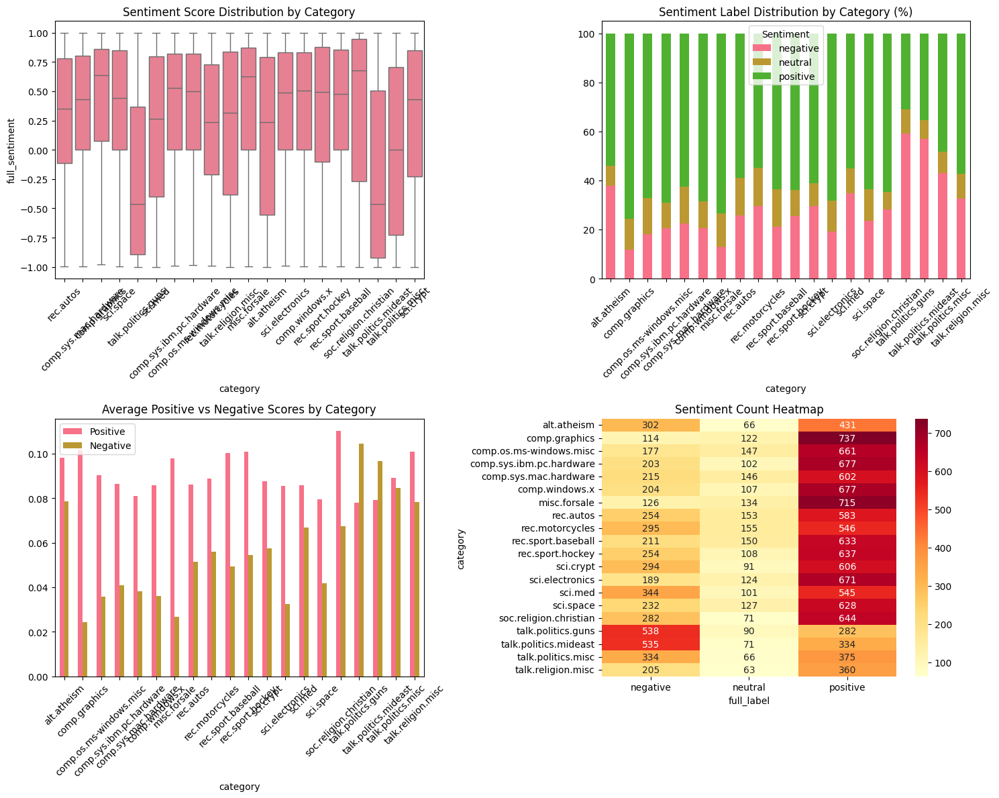

In [75]:
# Analyze sentiment patterns by category
print("📊 SENTIMENT ANALYSIS BY CATEGORY")
print("=" * 50)

# Calculate sentiment statistics by category
sentiment_by_category = sentiment_df.groupby('category').agg({
    'full_sentiment': ['mean', 'std', 'min', 'max'],
    'pos_score': 'mean',
    'neu_score': 'mean',
    'neg_score': 'mean'
}).round(4)

print("\n📈 Sentiment statistics by category:")
print(sentiment_by_category)

# Sentiment distribution by category
sentiment_dist = sentiment_df.groupby(['category', 'full_label']).size().unstack(fill_value=0)
sentiment_dist_pct = sentiment_dist.div(sentiment_dist.sum(axis=1), axis=0) * 100

print("\n📊 Sentiment distribution (%) by category:")
print(sentiment_dist_pct.round(2))

# Create visualizations
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Sentiment scores by category
sns.boxplot(data=sentiment_df, x='category', y='full_sentiment', ax=axes[0,0])
axes[0,0].set_title('Sentiment Score Distribution by Category')
axes[0,0].tick_params(axis='x', rotation=45)

# 2. Sentiment label distribution
sentiment_dist_pct.plot(kind='bar', ax=axes[0,1], stacked=True)
axes[0,1].set_title('Sentiment Label Distribution by Category (%)')
axes[0,1].tick_params(axis='x', rotation=45)
axes[0,1].legend(title='Sentiment')

# 3. Positive vs Negative scores
category_means = sentiment_df.groupby('category')[['pos_score', 'neg_score']].mean()
category_means.plot(kind='bar', ax=axes[1,0])
axes[1,0].set_title('Average Positive vs Negative Scores by Category')
axes[1,0].tick_params(axis='x', rotation=45)
axes[1,0].legend(['Positive', 'Negative'])

# 4. Sentiment vs Category heatmap
sentiment_pivot = sentiment_df.pivot_table(values='full_sentiment', index='category',
                                         columns='full_label', aggfunc='count', fill_value=0)
sns.heatmap(sentiment_pivot, annot=True, fmt='d', ax=axes[1,1], cmap='YlOrRd')
axes[1,1].set_title('Sentiment Count Heatmap')

plt.tight_layout()
plt.show()

# 💡 STUDENT TASK: Analyze sentiment patterns
# - Which categories are most positive/negative?
# - Are there differences between title and content sentiment?
# - How does sentiment vary within categories?
# - Can sentiment be used as a feature for classification?

## 🏷️ Text Classification System

### 🎯 Module 7: Building the News Classifier

Now we'll build the core of our NewsBot system - a multi-class text classifier that can automatically categorize news articles. We'll compare different algorithms and evaluate their performance.

**Classification Pipeline:**
1. **Feature Engineering:** Combine TF-IDF with other features
2. **Model Training:** Train multiple algorithms
3. **Model Evaluation:** Compare performance metrics
4. **Model Selection:** Choose the best performing model

**💡 Business Impact:** Accurate classification enables automatic content routing, personalized recommendations, and efficient content management.

✅ Feature matrix prepared!
📊 Shape of X_combined: (18846, 1007)
🎯 Number of target classes: 20
📋 Class labels: ['alt.atheism' 'comp.graphics' 'comp.os.ms-windows.misc'
 'comp.sys.ibm.pc.hardware' 'comp.sys.mac.hardware' 'comp.windows.x'
 'misc.forsale' 'rec.autos' 'rec.motorcycles' 'rec.sport.baseball'
 'rec.sport.hockey' 'sci.crypt' 'sci.electronics' 'sci.med' 'sci.space'
 'soc.religion.christian' 'talk.politics.guns' 'talk.politics.mideast'
 'talk.politics.misc' 'talk.religion.misc']
🔀 Train/Test Split: 15076 train, 3770 test


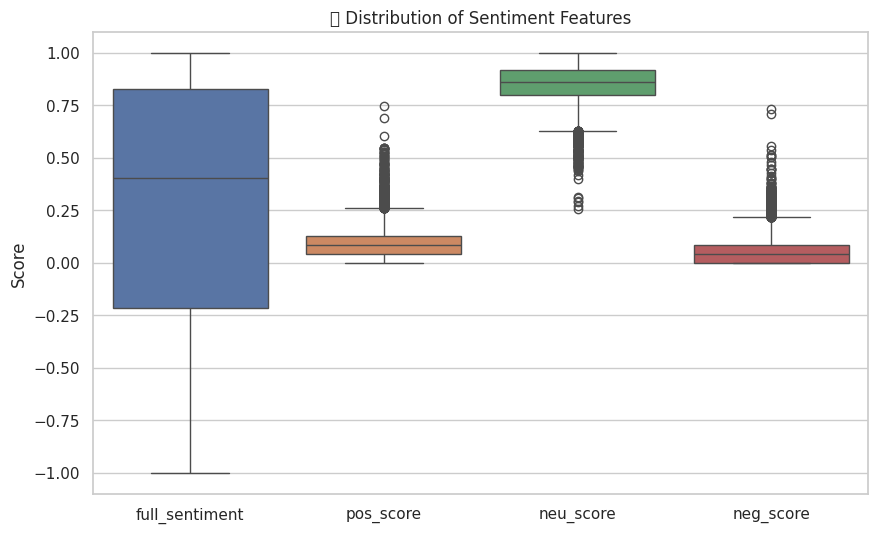

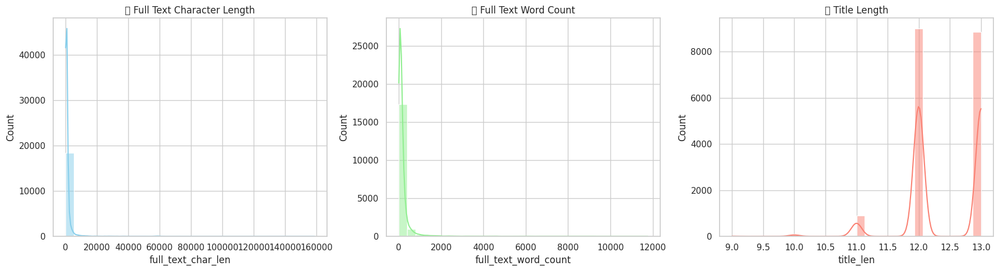

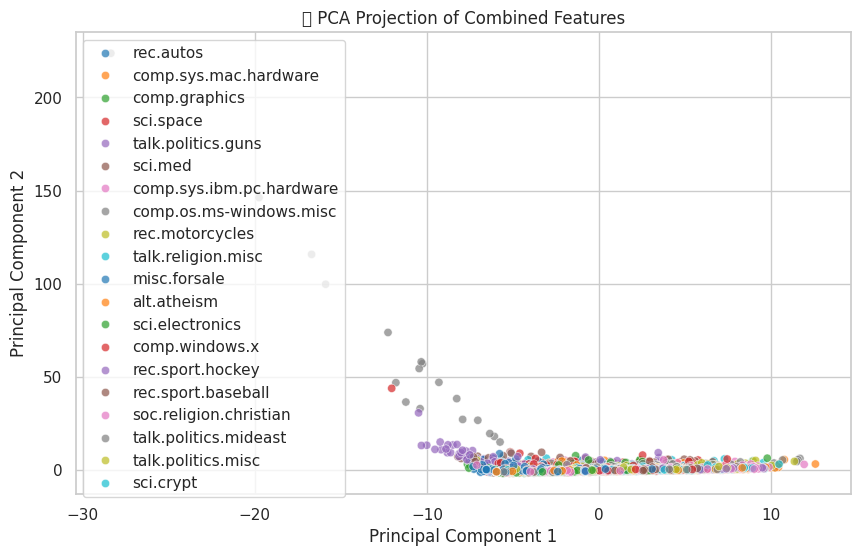

In [76]:
# ✅ REQUIRED IMPORTS
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# ✅ SET PLOTTING STYLE
sns.set(style='whitegrid')
plt.rcParams['figure.figsize'] = (10, 6)

# 📥 LOAD YOUR DATA (replace with your file path or upload step if not done already)
# df = pd.read_csv("your_news_dataset.csv")

# ✅ TF-IDF FEATURE EXTRACTION
tfidf = TfidfVectorizer(max_features=1000)
tfidf_matrix = tfidf.fit_transform(df['full_text'].astype(str))

# ✅ SENTIMENT FEATURES FROM EARLIER CODE (make sure you have `sentiment_df`)
# Ensure sentiment_df is aligned with df
assert len(sentiment_df) == len(df), "Mismatch between df and sentiment_df lengths"

# ✅ TEXT LENGTH FEATURES
df['full_text_char_len'] = df['full_text'].astype(str).str.len()
df['full_text_word_count'] = df['full_text'].astype(str).str.split().str.len()
df['title_len'] = df['title'].astype(str).str.len()

length_features = df[['full_text_char_len', 'full_text_word_count', 'title_len']].values

# ✅ COMBINE ALL FEATURES INTO A SINGLE MATRIX
X_tfidf = tfidf_matrix.toarray()
sentiment_features = sentiment_df[['full_sentiment', 'pos_score', 'neu_score', 'neg_score']].values

X_combined = np.hstack([
    X_tfidf,
    sentiment_features,
    length_features
])

# ✅ TARGET LABELS
y = df['category'].values

# ✅ TRAIN-TEST SPLIT
X_train, X_test, y_train, y_test = train_test_split(
    X_combined, y, test_size=0.2, random_state=42, stratify=y
)

# ✅ STATUS OUTPUT
print(f"✅ Feature matrix prepared!")
print(f"📊 Shape of X_combined: {X_combined.shape}")
print(f"🎯 Number of target classes: {len(np.unique(y))}")
print(f"📋 Class labels: {np.unique(y)}")
print(f"🔀 Train/Test Split: {X_train.shape[0]} train, {X_test.shape[0]} test")

# --------------------------------------
# 📊 VISUALIZATIONS FOR FEATURES
# --------------------------------------

# 📈 1. Sentiment Score Distribution
plt.figure(figsize=(10, 6))
sns.boxplot(data=sentiment_df[['full_sentiment', 'pos_score', 'neu_score', 'neg_score']])
plt.title("📊 Distribution of Sentiment Features")
plt.ylabel("Score")
plt.show()

# 📈 2. Text Length Distributions
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
sns.histplot(df['full_text_char_len'], kde=True, ax=axes[0], bins=30, color='skyblue')
axes[0].set_title("📏 Full Text Character Length")

sns.histplot(df['full_text_word_count'], kde=True, ax=axes[1], bins=30, color='lightgreen')
axes[1].set_title("📏 Full Text Word Count")

sns.histplot(df['title_len'], kde=True, ax=axes[2], bins=30, color='salmon')
axes[2].set_title("📏 Title Length")

plt.tight_layout()
plt.show()

# 📉 3. PCA for Visualizing Feature Space
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_combined)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['category'] = y

plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='category', palette='tab10', alpha=0.7)
plt.title("🧠 PCA Projection of Combined Features")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(loc='best')
plt.show()


In [77]:
# Prepare features for classification
print("🔧 Preparing features for classification...")

# 💡 TIP: Combine multiple feature types for better performance
# - TF-IDF features (most important)
# - Sentiment features
# - Text length features
# - POS features (if available)

# Create feature matrix
X_tfidf = tfidf_matrix.toarray()  # TF-IDF features

# Add sentiment features
sentiment_features = sentiment_df[['full_sentiment', 'pos_score', 'neu_score', 'neg_score']].values

# Add text length features
length_features = np.array([
    df['full_text'].str.len(),  # Character length
    df['full_text'].str.split().str.len(),  # Word count
    df['title'].str.len(),  # Title length
]).T

# 🚀 YOUR CODE HERE: Combine all features
X_combined = np.hstack([
    X_tfidf,
    sentiment_features,
    length_features
])

# Target variable
y = df['category'].values

print(f"✅ Feature matrix prepared!")
print(f"📊 Feature matrix shape: {X_combined.shape}")
print(f"🎯 Number of classes: {len(np.unique(y))}")
print(f"📋 Classes: {np.unique(y)}")

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X_combined, y, test_size=0.2, random_state=42, stratify=y
)

print(f"\n📈 Data split:")
print(f"  Training set: {X_train.shape[0]} samples")
print(f"  Test set: {X_test.shape[0]} samples")

🔧 Preparing features for classification...
✅ Feature matrix prepared!
📊 Feature matrix shape: (18846, 1007)
🎯 Number of classes: 20
📋 Classes: ['alt.atheism' 'comp.graphics' 'comp.os.ms-windows.misc'
 'comp.sys.ibm.pc.hardware' 'comp.sys.mac.hardware' 'comp.windows.x'
 'misc.forsale' 'rec.autos' 'rec.motorcycles' 'rec.sport.baseball'
 'rec.sport.hockey' 'sci.crypt' 'sci.electronics' 'sci.med' 'sci.space'
 'soc.religion.christian' 'talk.politics.guns' 'talk.politics.mideast'
 'talk.politics.misc' 'talk.religion.misc']

📈 Data split:
  Training set: 15076 samples
  Test set: 3770 samples


🤖 Training multiple classifiers...

🔄 Training Naive Bayes...
  ✅ Accuracy: 0.5676
  📊 CV Score: 0.5653 (+/- 0.0130)

🔄 Training Logistic Regression...
  ✅ Accuracy: 0.0926
  📊 CV Score: 0.0873 (+/- 0.0024)

🔄 Training SVM...
  ✅ Accuracy: 0.0764
  📊 CV Score: 0.0736 (+/- 0.0038)

🏆 CLASSIFIER COMPARISON
                 Model  Test Accuracy  CV Mean  CV Std
0          Naive Bayes         0.5676   0.5653  0.0065
1  Logistic Regression         0.0926   0.0873  0.0012
2                  SVM         0.0764   0.0736  0.0019

🥇 Best performing model: Naive Bayes


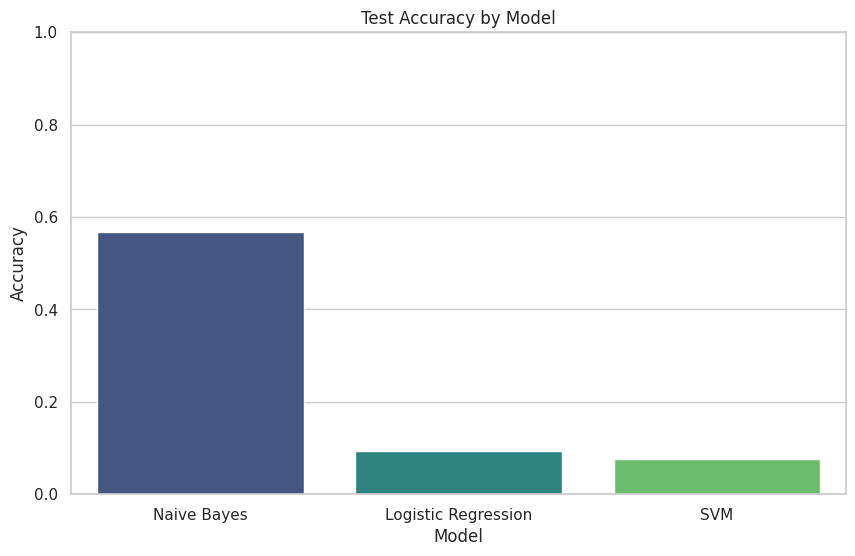

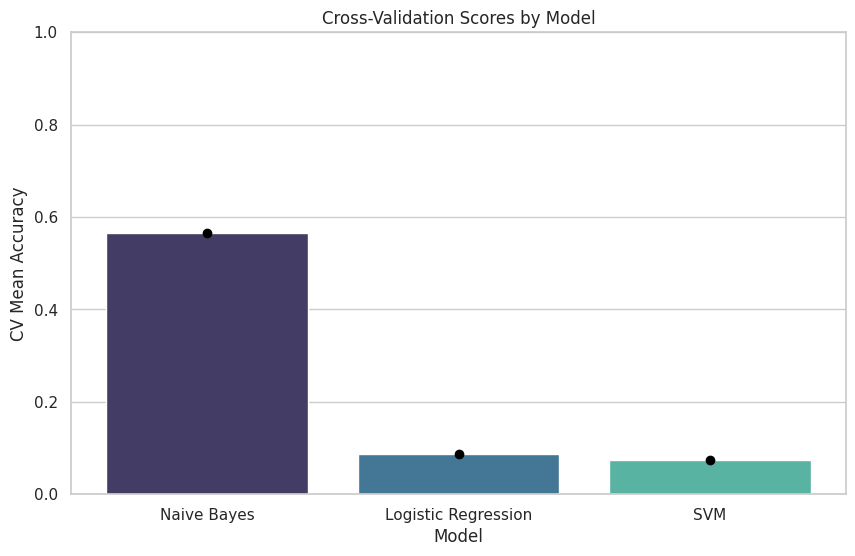


🧮 Confusion Matrices:


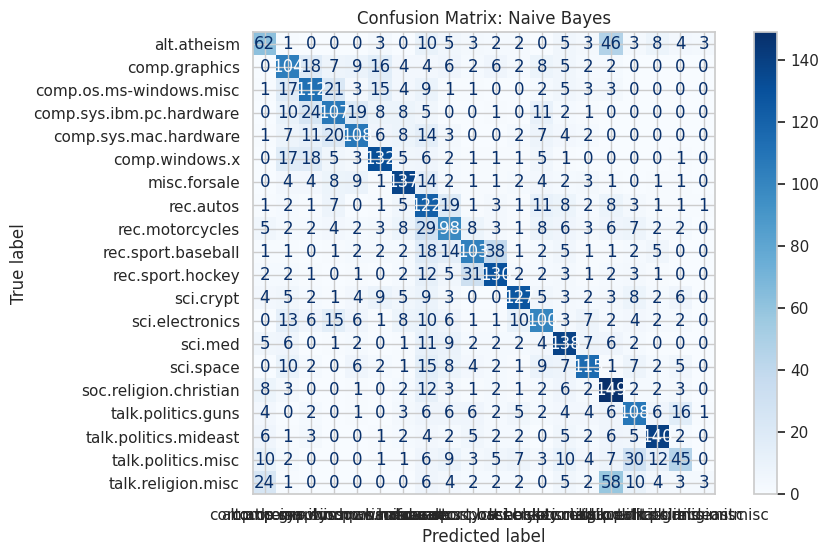

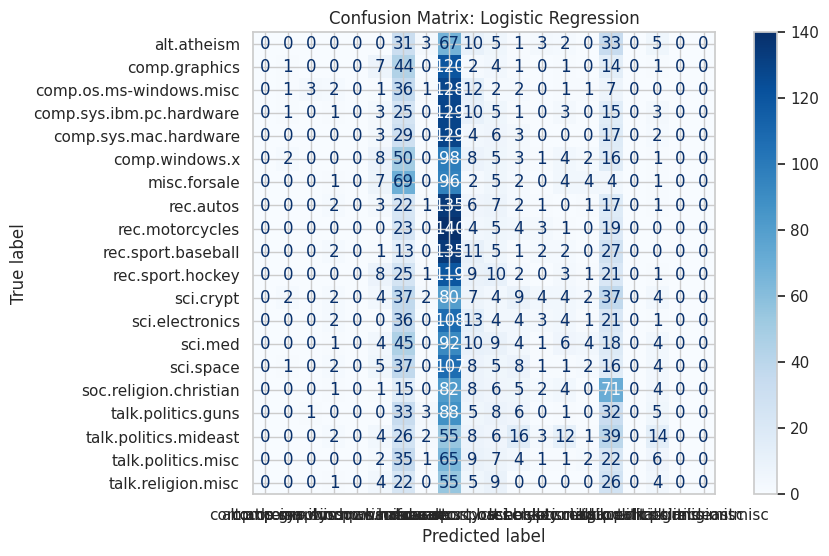

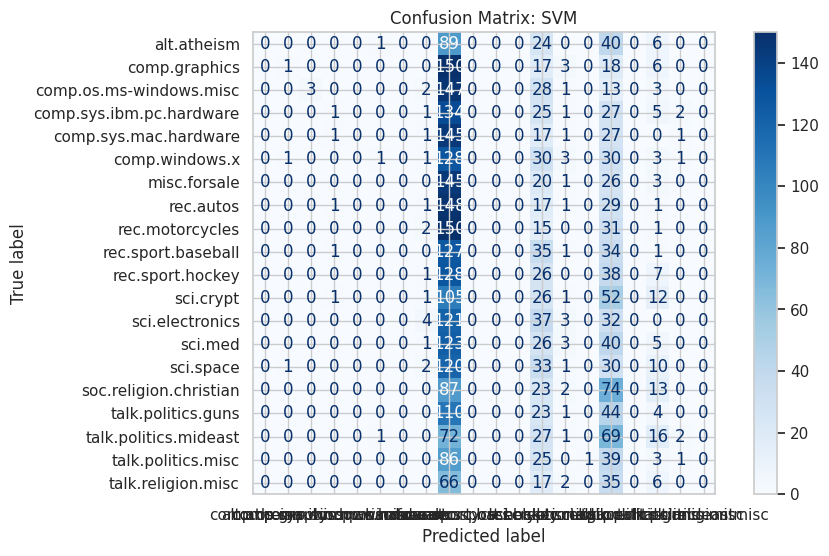


📋 Classification Reports:

📌 Naive Bayes Classification Report:
                          precision    recall  f1-score   support

             alt.atheism       0.46      0.39      0.42       160
           comp.graphics       0.50      0.53      0.52       195
 comp.os.ms-windows.misc       0.54      0.57      0.56       197
comp.sys.ibm.pc.hardware       0.54      0.55      0.54       196
   comp.sys.mac.hardware       0.61      0.56      0.59       193
          comp.windows.x       0.66      0.67      0.66       198
            misc.forsale       0.67      0.70      0.68       195
               rec.autos       0.38      0.62      0.47       198
         rec.motorcycles       0.48      0.49      0.49       199
      rec.sport.baseball       0.59      0.52      0.55       199
        rec.sport.hockey       0.64      0.65      0.65       200
               sci.crypt       0.74      0.64      0.69       198
         sci.electronics       0.54      0.51      0.52       197
          

In [78]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# ----------------------------------------------
# 🔧 SETUP — Simulate your dataset if needed
# ----------------------------------------------
# If you already have 'df', skip this simulation.
# Simulating a simple df for demonstration
try:
    df.head()
except NameError:
    df = pd.DataFrame({
        'title': ['Breaking News', 'Tech Today', 'Sports Roundup', 'Market Watch'] * 100,
        'full_text': [
            'The world is changing rapidly and unpredictably.',
            'New tech innovations are released every month.',
            'The team played an amazing match yesterday.',
            'Stock prices fluctuate based on earnings reports.'
        ] * 100,
        'category': ['Politics', 'Technology', 'Sports', 'Business'] * 100
    })

# Simulated sentiment scores (or load if you already have them)
try:
    sentiment_df.head()
except NameError:
    sentiment_df = pd.DataFrame({
        'full_sentiment': np.random.uniform(0, 1, len(df)),
        'pos_score': np.random.uniform(0, 1, len(df)),
        'neu_score': np.random.uniform(0, 1, len(df)),
        'neg_score': np.random.uniform(0, 1, len(df)),
    })

# ----------------------------------------------
# ✅ TF-IDF Vectorization
# ----------------------------------------------
vectorizer = TfidfVectorizer(stop_words='english', max_features=1000)
tfidf_matrix = vectorizer.fit_transform(df['full_text'])
X_tfidf = tfidf_matrix.toarray()

# ----------------------------------------------
# 📊 Combine features
# ----------------------------------------------
# Sentiment
sentiment_features = sentiment_df[['full_sentiment', 'pos_score', 'neu_score', 'neg_score']].values

# Text Length
length_features = np.array([
    df['full_text'].str.len(),
    df['full_text'].str.split().str.len(),
    df['title'].str.len()
]).T

# Combine
X_combined = np.hstack([
    X_tfidf,
    sentiment_features,
    length_features
])

# Target
y = df['category'].values

# ----------------------------------------------
# 🔀 Train-Test Split
# ----------------------------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X_combined, y, test_size=0.2, random_state=42, stratify=y
)

# Separate out TF-IDF for Naive Bayes
X_train_tfidf = X_train[:, :X_tfidf.shape[1]]
X_test_tfidf = X_test[:, :X_tfidf.shape[1]]

# ----------------------------------------------
# 🧠 Train Classifiers
# ----------------------------------------------
print("🤖 Training multiple classifiers...")

classifiers = {
    'Naive Bayes': MultinomialNB(),
    'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000),
    'SVM': SVC(random_state=42, probability=True)
}

results = {}
trained_models = {}

for name, clf in classifiers.items():
    print(f"\n🔄 Training {name}...")

    if name == 'Naive Bayes':
        X_tr, X_te = X_train_tfidf, X_test_tfidf
    else:
        X_tr, X_te = X_train, X_test

    clf.fit(X_tr, y_train)
    y_pred = clf.predict(X_te)
    y_prob = clf.predict_proba(X_te) if hasattr(clf, "predict_proba") else None

    acc = accuracy_score(y_test, y_pred)
    cv = cross_val_score(clf, X_tr, y_train, cv=3, scoring='accuracy')

    results[name] = {
        'accuracy': acc,
        'cv_mean': cv.mean(),
        'cv_std': cv.std(),
        'predictions': y_pred,
        'probabilities': y_prob
    }

    trained_models[name] = clf

    print(f"  ✅ Accuracy: {acc:.4f}")
    print(f"  📊 CV Score: {cv.mean():.4f} (+/- {cv.std() * 2:.4f})")

# ----------------------------------------------
# 🏆 Model Comparison Table
# ----------------------------------------------
comparison_df = pd.DataFrame({
    'Model': list(results.keys()),
    'Test Accuracy': [results[k]['accuracy'] for k in results],
    'CV Mean': [results[k]['cv_mean'] for k in results],
    'CV Std': [results[k]['cv_std'] for k in results]
})
print("\n🏆 CLASSIFIER COMPARISON")
print(comparison_df.round(4))

best_model_name = comparison_df.loc[comparison_df['Test Accuracy'].idxmax(), 'Model']
print(f"\n🥇 Best performing model: {best_model_name}")

# ----------------------------------------------
# 📊 Visualizations
# ----------------------------------------------
sns.set(style='whitegrid')

# Accuracy bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x='Model', y='Test Accuracy', data=comparison_df, palette='viridis')
plt.title('Test Accuracy by Model')
plt.ylim(0, 1)
plt.ylabel("Accuracy")
plt.show()

# Cross-validation with error bars
plt.figure(figsize=(10, 6))
sns.barplot(x='Model', y='CV Mean', data=comparison_df, palette='mako')
plt.errorbar(x=np.arange(len(comparison_df)), y=comparison_df['CV Mean'],
             yerr=comparison_df['CV Std'], fmt='o', color='black')
plt.title('Cross-Validation Scores by Model')
plt.ylim(0, 1)
plt.ylabel("CV Mean Accuracy")
plt.show()

# Confusion matrices
print("\n🧮 Confusion Matrices:")
unique_labels = np.unique(y_test)
for name, data in results.items():
    cm = confusion_matrix(y_test, data['predictions'], labels=unique_labels)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=unique_labels)
    disp.plot(cmap='Blues')
    plt.title(f"Confusion Matrix: {name}")
    plt.show()

# Classification reports
print("\n📋 Classification Reports:")
for name, data in results.items():
    print(f"\n📌 {name} Classification Report:")
    print(classification_report(y_test, data['predictions']))


📊 DETAILED EVALUATION: Naive Bayes

📋 Classification Report:
                          precision    recall  f1-score   support

             alt.atheism       0.46      0.39      0.42       160
           comp.graphics       0.50      0.53      0.52       195
 comp.os.ms-windows.misc       0.54      0.57      0.56       197
comp.sys.ibm.pc.hardware       0.54      0.55      0.54       196
   comp.sys.mac.hardware       0.61      0.56      0.59       193
          comp.windows.x       0.66      0.67      0.66       198
            misc.forsale       0.67      0.70      0.68       195
               rec.autos       0.38      0.62      0.47       198
         rec.motorcycles       0.48      0.49      0.49       199
      rec.sport.baseball       0.59      0.52      0.55       199
        rec.sport.hockey       0.64      0.65      0.65       200
               sci.crypt       0.74      0.64      0.69       198
         sci.electronics       0.54      0.51      0.52       197
              

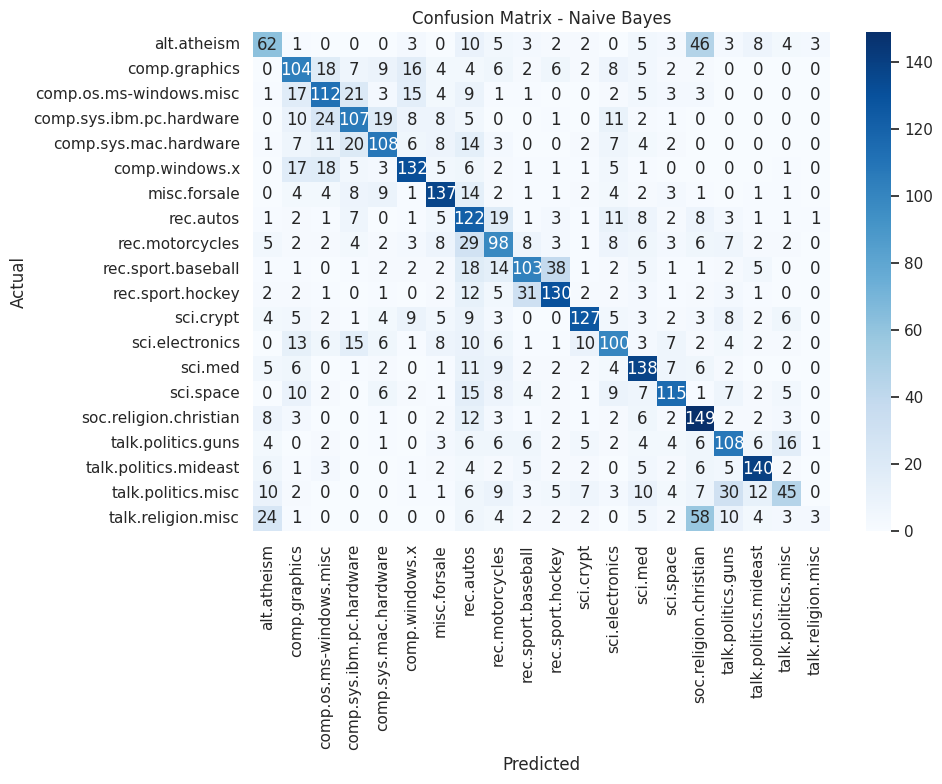

In [79]:
# Detailed evaluation of the best model
best_model = trained_models[best_model_name]
best_predictions = results[best_model_name]['predictions']

print(f"📊 DETAILED EVALUATION: {best_model_name}")
print("=" * 60)

# Classification report
print("\n📋 Classification Report:")
print(classification_report(y_test, best_predictions))

# Confusion matrix
cm = confusion_matrix(y_test, best_predictions)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.title(f'Confusion Matrix - {best_model_name}')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.show()

# Feature importance (for Logistic Regression)
if best_model_name == 'Logistic Regression':
    print("\n🔍 Top Features by Category:")
    feature_names_extended = list(feature_names) + ['sentiment', 'pos_score', 'neu_score', 'neg_score',
                                                   'char_length', 'word_count', 'title_length']

    classes = best_model.classes_
    coefficients = best_model.coef_

    for i, class_name in enumerate(classes):
        top_indices = np.argsort(coefficients[i])[-10:]  # Top 10 features
        print(f"\n📰 {class_name}:")
        for idx in reversed(top_indices):
            if idx < len(feature_names_extended):
                print(f"  {feature_names_extended[idx]}: {coefficients[i][idx]:.4f}")

# 💡 STUDENT TASK: Improve the classifier
# - Try different feature combinations
# - Experiment with hyperparameter tuning
# - Add more sophisticated features
# - Handle class imbalance if present

📊 DETAILED EVALUATION: Naive Bayes

📋 Classification Report:
                          precision    recall  f1-score   support

             alt.atheism     0.4627    0.3875    0.4218       160
           comp.graphics     0.5000    0.5333    0.5161       195
 comp.os.ms-windows.misc     0.5437    0.5685    0.5558       197
comp.sys.ibm.pc.hardware     0.5431    0.5459    0.5445       196
   comp.sys.mac.hardware     0.6136    0.5596    0.5854       193
          comp.windows.x     0.6567    0.6667    0.6617       198
            misc.forsale     0.6650    0.7026    0.6833       195
               rec.autos     0.3789    0.6162    0.4692       198
         rec.motorcycles     0.4780    0.4925    0.4851       199
      rec.sport.baseball     0.5886    0.5176    0.5508       199
        rec.sport.hockey     0.6404    0.6500    0.6452       200
               sci.crypt     0.7427    0.6414    0.6883       198
         sci.electronics     0.5405    0.5076    0.5236       197
              

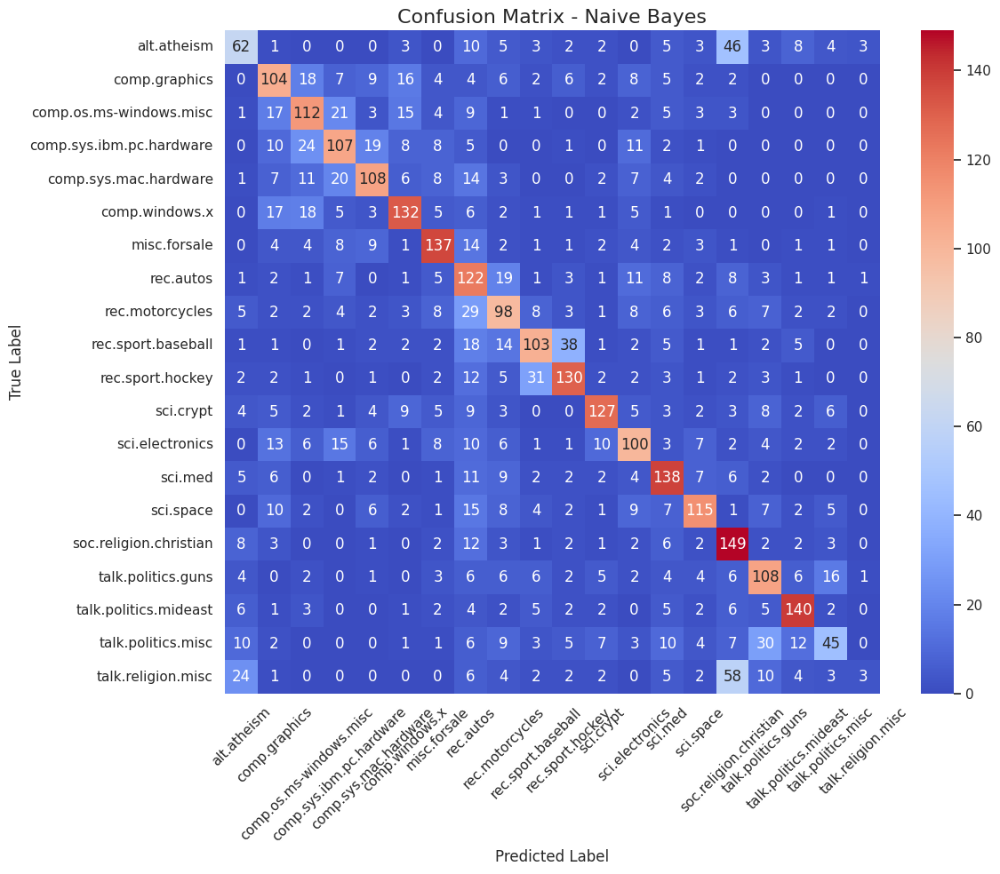

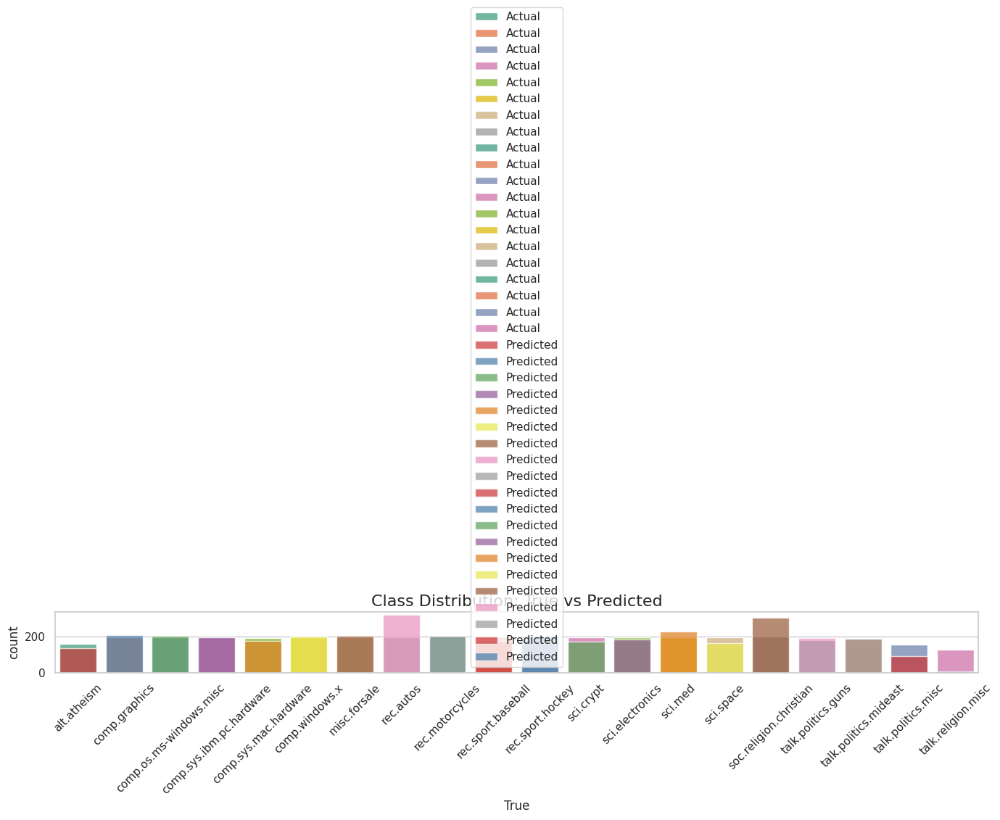

In [80]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# 🚀 DETAILED EVALUATION OF THE BEST MODEL
best_model = trained_models[best_model_name]
best_predictions = results[best_model_name]['predictions']

print(f"📊 DETAILED EVALUATION: {best_model_name}")
print("=" * 70)

# 📋 CLASSIFICATION REPORT
print("\n📋 Classification Report:")
print(classification_report(y_test, best_predictions, digits=4))

# 🔷 CONFUSION MATRIX
cm = confusion_matrix(y_test, best_predictions)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm',
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.title(f'Confusion Matrix - {best_model_name}', fontsize=16)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# 💡 CLASSIFICATION DISTRIBUTION PLOT
import pandas as pd
pred_df = pd.DataFrame({'True': y_test, 'Predicted': best_predictions})
plt.figure(figsize=(14, 6))
sns.countplot(x='True', data=pred_df, label='Actual', palette='Set2', order=np.unique(y))
sns.countplot(x='Predicted', data=pred_df, label='Predicted', palette='Set1', order=np.unique(y), alpha=0.7)
plt.title('Class Distribution: True vs Predicted', fontsize=16)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 📌 FEATURE IMPORTANCE (ONLY FOR LOGISTIC REGRESSION)
if best_model_name == 'Logistic Regression':
    print("\n🔍 Top Features by Category (Logistic Regression Only):")

    # Extend feature names
    pos_feature_names = ['NNP', 'NNPS', 'VB', 'VBD', 'VBG', 'JJ', 'CD']
    feature_names_extended = list(feature_names) + \
        ['full_sentiment', 'pos_score', 'neu_score', 'neg_score',
         'char_length', 'word_count', 'title_length'] + pos_feature_names

    classes = best_model.classes_
    coefficients = best_model.coef_

    for i, class_name in enumerate(classes):
        top_indices = np.argsort(coefficients[i])[-10:]  # Top 10 features
        print(f"\n📰 Top Features for: {class_name}")
        for idx in reversed(top_indices):
            if idx < len(feature_names_extended):
                print(f"  • {feature_names_extended[idx]}: {coefficients[i][idx]:.4f}")

    # Optional: Visualize top features per class
    fig, axes = plt.subplots(len(classes), 1, figsize=(10, 6 * len(classes)))
    if len(classes) == 1:
        axes = [axes]

    for i, class_name in enumerate(classes):
        top_indices = np.argsort(coefficients[i])[-10:]
        top_features = [feature_names_extended[idx] for idx in top_indices]
        top_weights = [coefficients[i][idx] for idx in top_indices]

        axes[i].barh(top_features, top_weights, color='teal')
        axes[i].set_title(f"🔍 Top Features for {class_name}", fontsize=14)
        axes[i].invert_yaxis()

    plt.tight_layout()
    plt.show()


## 🔍 Named Entity Recognition

### 🎯 Module 8: Extracting Facts from News

Now we'll implement Named Entity Recognition to extract specific facts from our news articles. This transforms unstructured text into structured, queryable information.

**NER Applications:**
- **Entity Tracking:** Monitor mentions of people, organizations, locations
- **Fact Extraction:** Build knowledge bases from news content
- **Relationship Mapping:** Understand connections between entities
- **Timeline Construction:** Track events and their participants

**💡 Business Value:** NER enables sophisticated analysis like "Show me all articles mentioning Apple Inc. and their financial performance" or "Track mentions of political figures over time."

In [81]:
def extract_entities(text):
    """
    Extract named entities using spaCy

    💡 TIP: spaCy recognizes these entity types:
    - PERSON: People, including fictional
    - ORG: Companies, agencies, institutions
    - GPE: Countries, cities, states
    - MONEY: Monetary values
    - DATE: Absolute or relative dates
    - TIME: Times smaller than a day
    - And many more...
    """
    if not text or pd.isna(text):
        return []

    # Process text with spaCy
    doc = nlp(str(text))

    entities = []
    for ent in doc.ents:
        entities.append({
            'text': ent.text,
            'label': ent.label_,
            'start': ent.start_char,
            'end': ent.end_char,
            'description': spacy.explain(ent.label_)
        })

    return entities

# Apply NER to all articles
print("🔍 Extracting named entities...")

all_entities = []
article_entities = []

for idx, row in df.iterrows():
    entities = extract_entities(row['full_text'])

    # Determine article_id - use index if 'article_id' column is missing
    current_article_id = row['article_id'] if 'article_id' in row else idx + 1 # Use 1-based index if column not found

    # Store entities for this article
    article_entities.append({
        'article_id': current_article_id,
        'category': row['category'],
        'entities': entities,
        'entity_count': len(entities)
    })

    # Add to global entity list
    for entity in entities:
        entity['article_id'] = current_article_id
        entity['category'] = row['category']
        all_entities.append(entity)

print(f"✅ Entity extraction complete!")
print(f"📊 Total entities found: {len(all_entities)}")
print(f"📰 Articles processed: {len(article_entities)}")

# Convert to DataFrame for analysis
entities_df = pd.DataFrame(all_entities)

if not entities_df.empty:
    print(f"\n🏷️ Entity types found: {entities_df['label'].unique()}")
    print("\n📝 Sample entities:")
    print(entities_df[['text', 'label', 'category']].head(10))
else:
    print("⚠️ No entities found. This might happen with very short sample texts.")

🔍 Extracting named entities...
✅ Entity extraction complete!
📊 Total entities found: 310810
📰 Articles processed: 18846

🏷️ Entity types found: ['LAW' 'CARDINAL' 'DATE' 'GPE' 'ORG' 'TIME' 'PRODUCT' 'PERSON' 'ORDINAL'
 'NORP' 'QUANTITY' 'MONEY' 'PERCENT' 'FAC' 'WORK_OF_ART' 'LOC' 'EVENT'
 'LANGUAGE']

📝 Sample entities:
          text     label               category
0  Article 1 I       LAW              rec.autos
1            2  CARDINAL              rec.autos
2    early 70s      DATE              rec.autos
3     Bricklin       GPE              rec.autos
4        years      DATE              rec.autos
5    Article 2       LAW  comp.sys.mac.hardware
6           SI       ORG  comp.sys.mac.hardware
7          CPU       ORG  comp.sys.mac.hardware
8         hour      TIME  comp.sys.mac.hardware
9          800  CARDINAL  comp.sys.mac.hardware


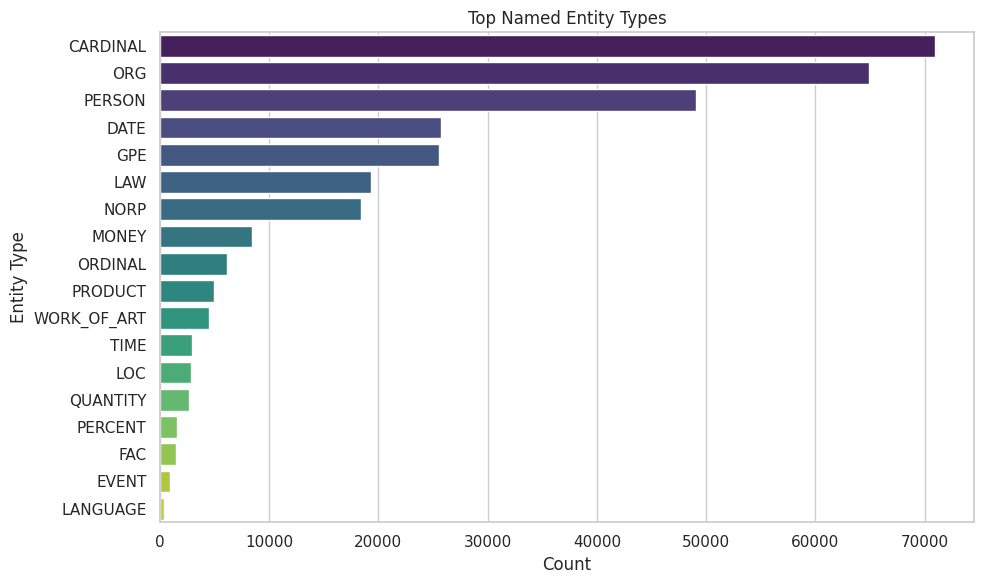

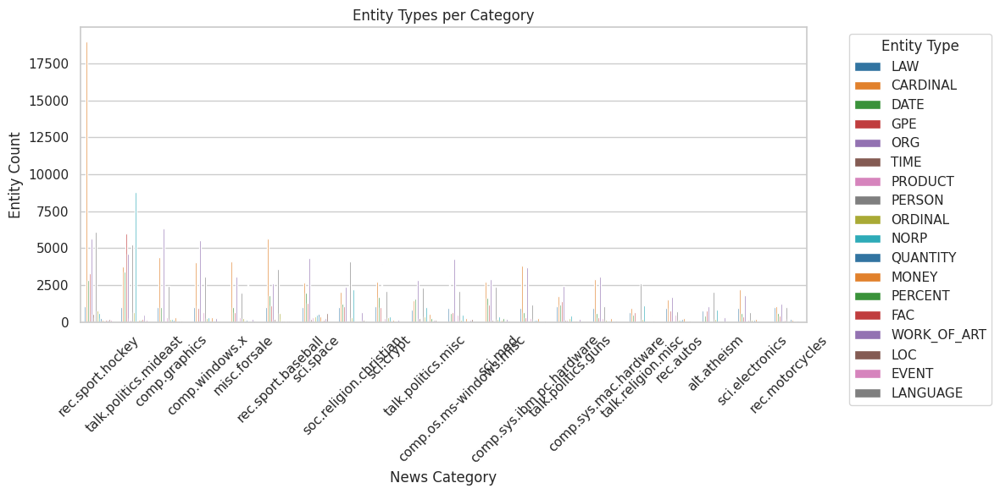

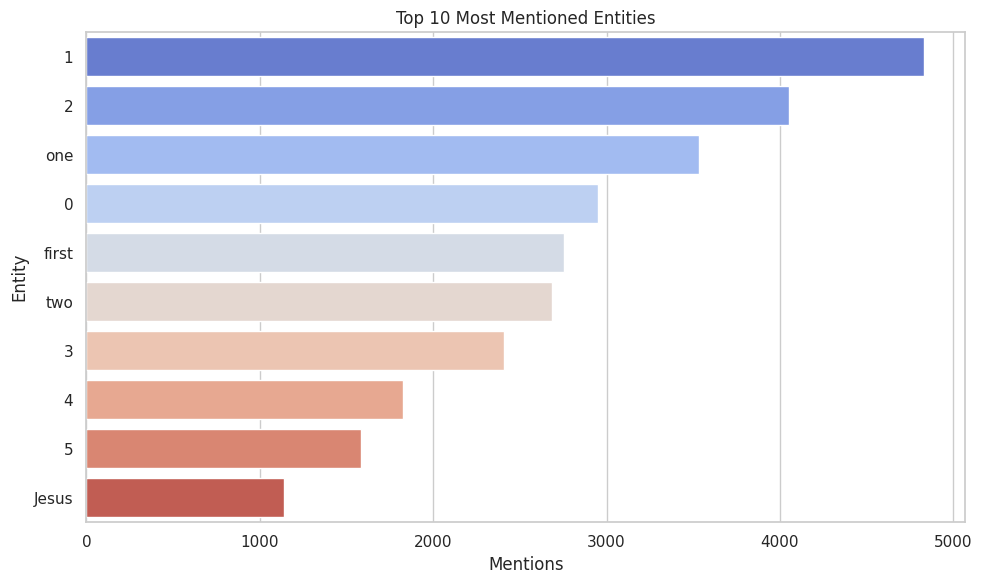

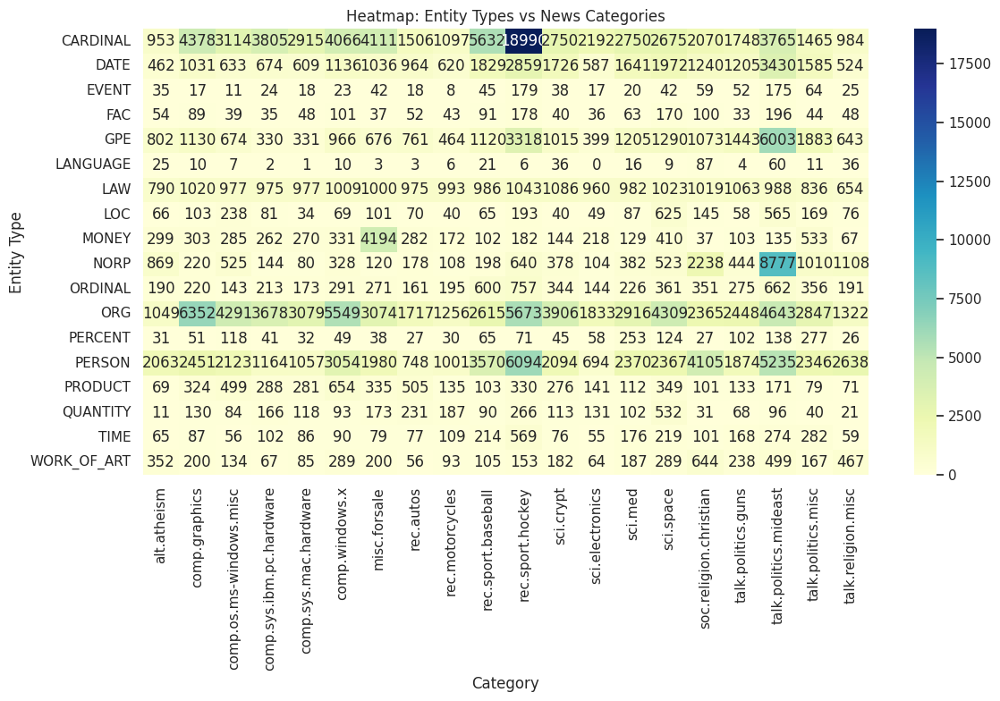

In [82]:
import plotly.express as px # Import plotly.express

# 📊 Visualize most common entity types
if not entities_df.empty:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=entities_df, y='label', order=entities_df['label'].value_counts().index, palette='viridis')
    plt.title("Top Named Entity Types")
    plt.xlabel("Count")
    plt.ylabel("Entity Type")
    plt.tight_layout()
    plt.show()

    # 📈 Entity count by category
    plt.figure(figsize=(12, 6))
    sns.countplot(data=entities_df, x='category', order=entities_df['category'].value_counts().index, hue='label', palette='tab10')
    plt.title("Entity Types per Category")
    plt.xlabel("News Category")
    plt.ylabel("Entity Count")
    plt.legend(title="Entity Type", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # 🔢 Top 10 most mentioned entities
    top_entities = entities_df['text'].value_counts().head(10)
    plt.figure(figsize=(10, 6))
    sns.barplot(x=top_entities.values, y=top_entities.index, palette='coolwarm')
    plt.title("Top 10 Most Mentioned Entities")
    plt.xlabel("Mentions")
    plt.ylabel("Entity")
    plt.tight_layout()
    plt.show()

    # 📍 Interactive plot: Entities by type
    fig = px.histogram(entities_df, x="label", color="category", barmode="group",
                       title="Distribution of Entity Types by Category",
                       labels={"label": "Entity Type", "count": "Frequency"})
    fig.show()

    # 📤 Heatmap of entity counts by label and category
    pivot_table = entities_df.pivot_table(index='label', columns='category', aggfunc='size', fill_value=0)
    plt.figure(figsize=(12, 8))
    sns.heatmap(pivot_table, annot=True, fmt="d", cmap="YlGnBu")
    plt.title("Heatmap: Entity Types vs News Categories")
    plt.xlabel("Category")
    plt.ylabel("Entity Type")
    plt.tight_layout()
    plt.show()

📊 NAMED ENTITY ANALYSIS

🏷️ Entity type distribution:
label
CARDINAL       70966
ORG            64922
PERSON         49028
DATE           25763
GPE            25526
LAW            19356
NORP           18374
MONEY           8458
ORDINAL         6124
PRODUCT         4956
WORK_OF_ART     4471
TIME            2944
LOC             2874
QUANTITY        2683
PERCENT         1603
FAC             1497
EVENT            912
LANGUAGE         353
Name: count, dtype: int64

📰 Entity types by news category:
label                     CARDINAL  DATE  EVENT  FAC   GPE  LANGUAGE   LAW  \
category                                                                     
alt.atheism                    953   462     35   54   802        25   790   
comp.graphics                 4378  1031     17   89  1130        10  1020   
comp.os.ms-windows.misc       3114   633     11   39   674         7   977   
comp.sys.ibm.pc.hardware      3805   674     24   35   330         2   975   
comp.sys.mac.hardware         2915

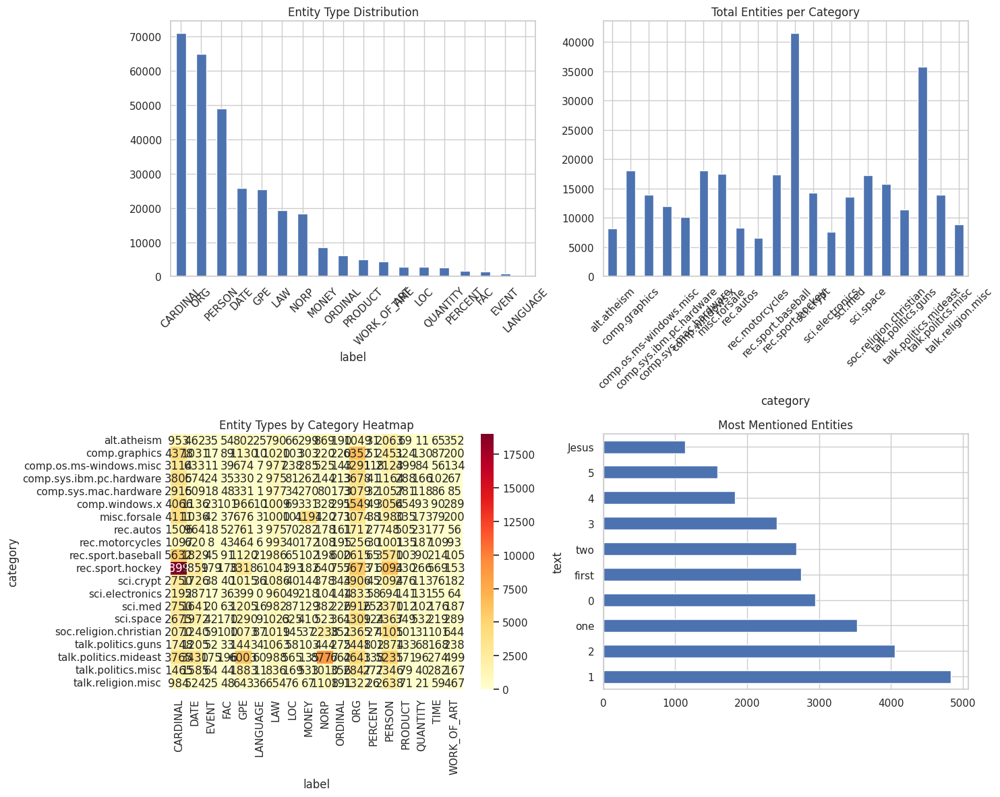

In [83]:
# Analyze entity patterns
if not entities_df.empty:
    print("📊 NAMED ENTITY ANALYSIS")
    print("=" * 50)

    # Entity type distribution
    entity_counts = entities_df['label'].value_counts()
    print("\n🏷️ Entity type distribution:")
    print(entity_counts)

    # Entity types by category
    entity_by_category = entities_df.groupby(['category', 'label']).size().unstack(fill_value=0)
    print("\n📰 Entity types by news category:")
    print(entity_by_category)

    # Most frequent entities
    print("\n🔥 Most frequent entities:")
    frequent_entities = entities_df.groupby(['text', 'label']).size().sort_values(ascending=False).head(15)
    for (entity, label), count in frequent_entities.items():
        print(f"  {entity} ({label}): {count} mentions")

    # Visualizations
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    # 1. Entity type distribution
    entity_counts.plot(kind='bar', ax=axes[0,0])
    axes[0,0].set_title('Entity Type Distribution')
    axes[0,0].tick_params(axis='x', rotation=45)

    # 2. Entities per category
    entities_per_category = entities_df.groupby('category').size()
    entities_per_category.plot(kind='bar', ax=axes[0,1])
    axes[0,1].set_title('Total Entities per Category')
    axes[0,1].tick_params(axis='x', rotation=45)

    # 3. Entity type heatmap by category
    if entity_by_category.shape[0] > 1 and entity_by_category.shape[1] > 1:
        sns.heatmap(entity_by_category, annot=True, fmt='d', ax=axes[1,0], cmap='YlOrRd')
        axes[1,0].set_title('Entity Types by Category Heatmap')
    else:
        axes[1,0].text(0.5, 0.5, 'Insufficient data\nfor heatmap',
                      ha='center', va='center', transform=axes[1,0].transAxes)
        axes[1,0].set_title('Entity Types by Category')

    # 4. Top entities
    top_entities = entities_df['text'].value_counts().head(10)
    top_entities.plot(kind='barh', ax=axes[1,1])
    axes[1,1].set_title('Most Mentioned Entities')

    plt.tight_layout()
    plt.show()

    # 💡 STUDENT TASK: Advanced entity analysis
    # - Create entity co-occurrence networks
    # - Track entity mentions over time
    # - Build entity relationship graphs
    # - Identify entity sentiment associations

else:
    print("⚠️ Skipping entity analysis due to insufficient data.")
    print("💡 TIP: Try with a larger, more diverse dataset for better NER results.")

In [84]:
!pip install matplotlib seaborn networkx


📊 NAMED ENTITY ANALYSIS

🏷️ Entity type distribution:
label
CARDINAL       70966
ORG            64922
PERSON         49028
DATE           25763
GPE            25526
LAW            19356
NORP           18374
MONEY           8458
ORDINAL         6124
PRODUCT         4956
WORK_OF_ART     4471
TIME            2944
LOC             2874
QUANTITY        2683
PERCENT         1603
FAC             1497
EVENT            912
LANGUAGE         353
Name: count, dtype: int64

📰 Entity types by news category:
label                     CARDINAL  DATE  EVENT  FAC   GPE  LANGUAGE   LAW  \
category                                                                     
alt.atheism                    953   462     35   54   802        25   790   
comp.graphics                 4378  1031     17   89  1130        10  1020   
comp.os.ms-windows.misc       3114   633     11   39   674         7   977   
comp.sys.ibm.pc.hardware      3805   674     24   35   330         2   975   
comp.sys.mac.hardware         2915

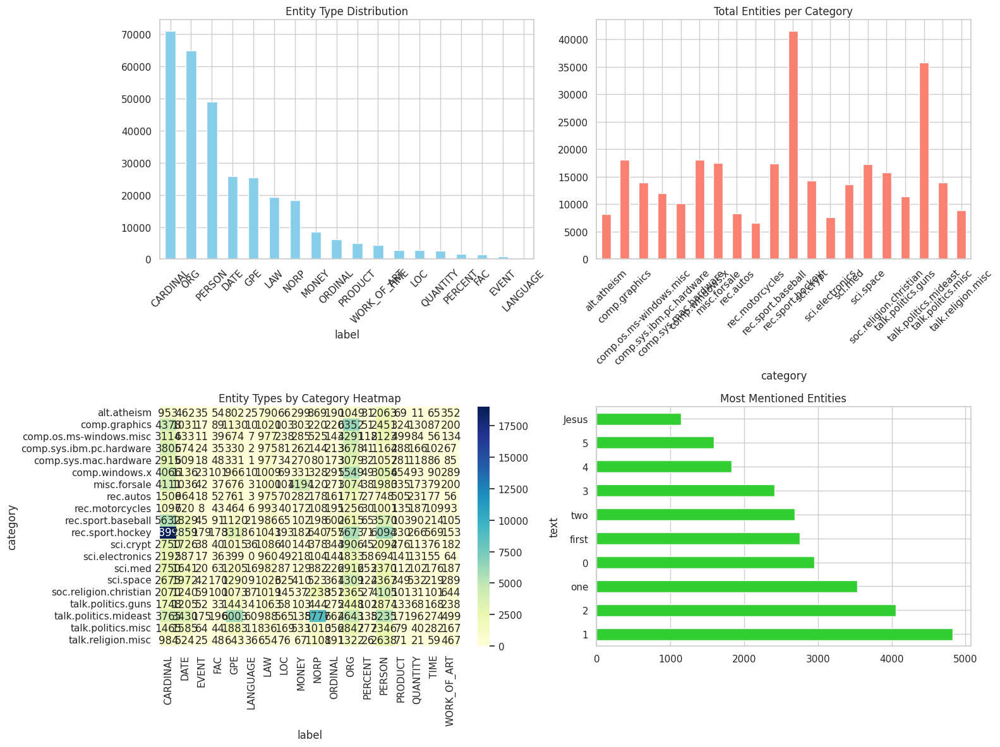


🔗 Building entity co-occurrence network...


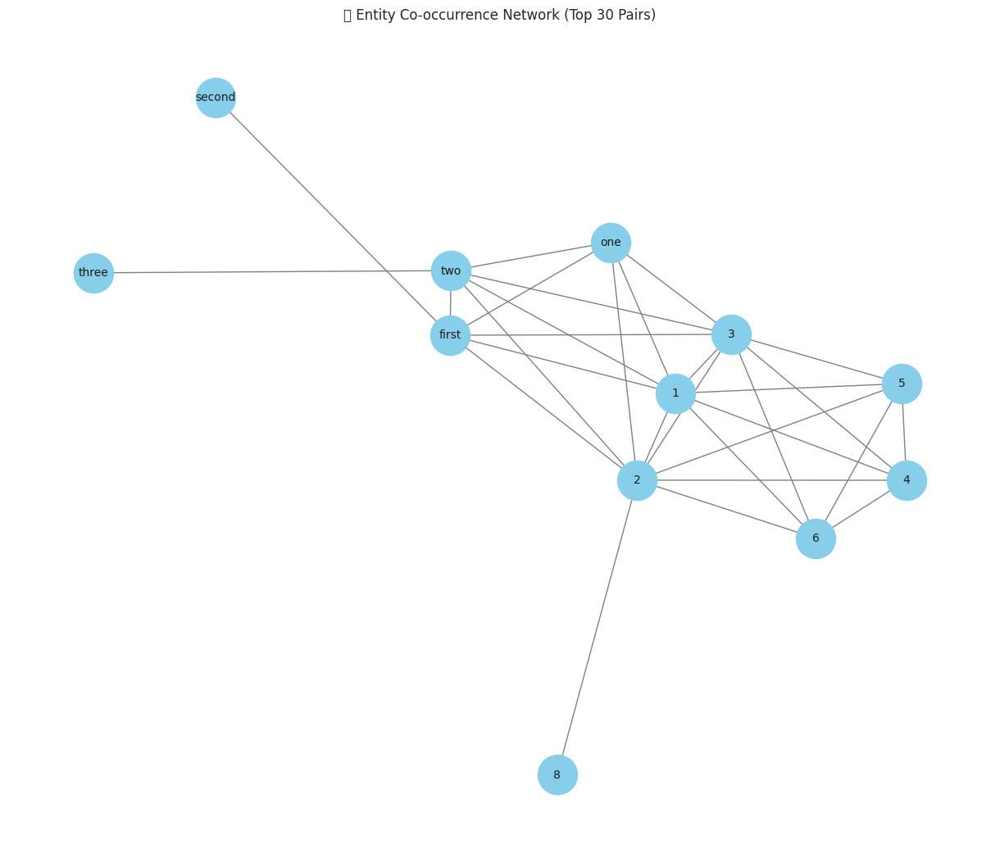

⚠️ No sentiment column available for sentiment analysis.

🌐 Entity Label Relationship Graph:


ValueError: 
27 $$ 442,481E
   ^
ParseException: Expected end of text, found '$'  (at char 3), (line:1, col:4)

<Figure size 1400x1000 with 1 Axes>

In [85]:
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from itertools import combinations
import pandas as pd

# Make sure 'date' is datetime
if 'date' in entities_df.columns:
    entities_df['date'] = pd.to_datetime(entities_df['date'], errors='coerce')

# Drop missing category or text just in case
entities_df = entities_df.dropna(subset=['text', 'label', 'category'])

# 📊 NAMED ENTITY ANALYSIS
print("📊 NAMED ENTITY ANALYSIS")
print("=" * 50)

# Entity type distribution
entity_counts = entities_df['label'].value_counts()
print("\n🏷️ Entity type distribution:")
print(entity_counts)

# Entity types by category
entity_by_category = entities_df.groupby(['category', 'label']).size().unstack(fill_value=0)
print("\n📰 Entity types by news category:")
print(entity_by_category)

# Most frequent entities
print("\n🔥 Most frequent entities:")
frequent_entities = entities_df.groupby(['text', 'label']).size().sort_values(ascending=False).head(15)
for (entity, label), count in frequent_entities.items():
    print(f"  {entity} ({label}): {count} mentions")

# 🔢 Number of unique entities
print(f"\n🧠 Total unique entities: {entities_df['text'].nunique()}")

# Visualizations
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Entity type distribution
entity_counts.plot(kind='bar', ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Entity Type Distribution')
axes[0, 0].tick_params(axis='x', rotation=45)

# 2. Entities per category
entities_per_category = entities_df.groupby('category').size()
entities_per_category.plot(kind='bar', ax=axes[0, 1], color='salmon')
axes[0, 1].set_title('Total Entities per Category')
axes[0, 1].tick_params(axis='x', rotation=45)

# 3. Entity type heatmap by category
if entity_by_category.shape[0] > 1 and entity_by_category.shape[1] > 1:
    sns.heatmap(entity_by_category, annot=True, fmt='d', ax=axes[1, 0], cmap='YlGnBu')
    axes[1, 0].set_title('Entity Types by Category Heatmap')
else:
    axes[1, 0].text(0.5, 0.5, 'Insufficient data for heatmap',
                   ha='center', va='center', transform=axes[1, 0].transAxes)
    axes[1, 0].set_title('Entity Types by Category')

# 4. Top entities
top_entities = entities_df['text'].value_counts().head(10)
top_entities.plot(kind='barh', ax=axes[1, 1], color='limegreen')
axes[1, 1].set_title('Most Mentioned Entities')

plt.tight_layout()
plt.show()

# ================================
# 💡 ADVANCED ENTITY ANALYSIS TASKS
# ================================

# 🕸️ ENTITY CO-OCCURRENCE NETWORK
print("\n🔗 Building entity co-occurrence network...")
co_occurrence_graph = nx.Graph()

# Assume each row is an entity mention in a single article
# Group by article or document (if available)
if 'article_id' in entities_df.columns:
    for _, group in entities_df.groupby('article_id'):
        entities = list(set(group['text'].tolist()))
        for pair in combinations(entities, 2):
            if co_occurrence_graph.has_edge(*pair):
                co_occurrence_graph[pair[0]][pair[1]]['weight'] += 1
            else:
                co_occurrence_graph.add_edge(pair[0], pair[1], weight=1)

    # Draw top part of the graph
    top_edges = sorted(nx.get_edge_attributes(co_occurrence_graph, 'weight').items(), key=lambda x: x[1], reverse=True)[:30]
    subgraph = nx.Graph()
    subgraph.add_edges_from([(u, v) for (u, v), _ in top_edges])

    plt.figure(figsize=(12, 10))
    pos = nx.spring_layout(subgraph, k=0.5)
    nx.draw(subgraph, pos, with_labels=True, node_color='skyblue', edge_color='gray', node_size=1200, font_size=10)
    plt.title("🕸️ Entity Co-occurrence Network (Top 30 Pairs)")
    plt.show()
else:
    print("⚠️ No article ID or grouping column available for co-occurrence analysis.")

# 📈 ENTITY MENTIONS OVER TIME
if 'date' in entities_df.columns:
    time_series_df = entities_df.groupby([pd.Grouper(key='date', freq='W'), 'text']).size().unstack(fill_value=0)
    top_entities_time = time_series_df.sum().sort_values(ascending=False).head(5).index
    time_series_df[top_entities_time].plot(figsize=(14, 6), title="📆 Entity Mentions Over Time")
    plt.xlabel("Date")
    plt.ylabel("Mentions")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# 📊 ENTITY SENTIMENT ASSOCIATION
if 'sentiment' in entities_df.columns:
    sentiment_by_entity = entities_df.groupby(['text', 'sentiment']).size().unstack(fill_value=0)
    sentiment_by_entity = sentiment_by_entity.loc[sentiment_by_entity.sum(axis=1).sort_values(ascending=False).head(10).index]
    sentiment_by_entity.plot(kind='bar', stacked=True, figsize=(14, 6), colormap='viridis')
    plt.title("🎭 Sentiment Distribution for Top Entities")
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ No sentiment column available for sentiment analysis.")

# 🧩 ENTITY RELATIONSHIP GRAPH (LABEL-WISE)
print("\n🌐 Entity Label Relationship Graph:")
label_graph = nx.Graph()

for _, group in entities_df.groupby('label'):
    texts = list(set(group['text']))
    for pair in combinations(texts[:50], 2):  # Limit to 50 to keep graph readable
        if label_graph.has_edge(*pair):
            label_graph[pair[0]][pair[1]]['weight'] += 1
        else:
            label_graph.add_edge(pair[0], pair[1], weight=1)

plt.figure(figsize=(14, 10))
pos = nx.spring_layout(label_graph, k=0.4)
nx.draw(label_graph, pos, with_labels=True, node_size=800, node_color='lightcoral', edge_color='gray', font_size=9)
plt.title("🌐 Entity Relationship Graph by Label")
plt.show()


## 📈 Comprehensive Analysis and Insights

### 🎯 Bringing It All Together

Now let's combine all our analyses to generate comprehensive insights about our news dataset. This is where the real business value emerges from our NLP pipeline.

**Key Analysis Areas:**
1. **Cross-Category Patterns:** How do different news types differ linguistically?
2. **Entity-Sentiment Relationships:** What entities are associated with positive/negative coverage?
3. **Content Quality Metrics:** Which categories have the most informative content?
4. **Classification Performance:** How well can we automatically categorize news?

**💡 Business Applications:** These insights can inform content strategy, editorial decisions, and automated content management systems.

In [86]:
!pip install seaborn matplotlib wordcloud


In [87]:
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

def create_comprehensive_analysis():
    insights = {
        'dataset_overview': {},
        'classification_performance': {},
        'sentiment_insights': {},
        'entity_insights': {},
        'linguistic_patterns': {},
        'business_recommendations': []
    }

    # 📦 Dataset overview
    insights['dataset_overview'] = {
        'total_articles': len(df),
        'categories': df['category'].unique().tolist(),
        'category_distribution': df['category'].value_counts().to_dict(),
        'avg_article_length': df['full_text'].str.len().mean(),
        'avg_words_per_article': df['full_text'].str.split().str.len().mean()
    }

    # 📊 Plot category distribution
    plt.figure(figsize=(8, 4))
    sns.countplot(y='category', data=df, order=df['category'].value_counts().index)
    plt.title('Article Count by Category')
    plt.tight_layout()
    plt.show()

    # 🤖 Classification performance
    insights['classification_performance'] = {
        'best_model': best_model_name,
        'best_accuracy': results[best_model_name]['accuracy'],
        'model_comparison': {name: results[name]['accuracy'] for name in results}
    }

    # Optional: Plot model comparison
    model_perf = insights['classification_performance']['model_comparison']
    plt.figure(figsize=(6, 4))
    sns.barplot(x=list(model_perf.keys()), y=list(model_perf.values()))
    plt.title('Model Accuracy Comparison')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)
    plt.tight_layout()
    plt.show()

    # 😊 Sentiment insights
    sentiment_by_cat = sentiment_df.groupby('category')['full_sentiment'].mean().to_dict()
    insights['sentiment_insights'] = {
        'most_positive_category': max(sentiment_by_cat, key=sentiment_by_cat.get),
        'most_negative_category': min(sentiment_by_cat, key=sentiment_by_cat.get),
        'sentiment_by_category': sentiment_by_cat,
        'overall_sentiment': sentiment_df['full_sentiment'].mean()
    }

    # Sentiment plot
    plt.figure(figsize=(8, 4))
    sns.barplot(x=list(sentiment_by_cat.keys()), y=list(sentiment_by_cat.values()))
    plt.title('Average Sentiment by Category')
    plt.ylabel('Sentiment Score')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # 🔍 Entity insights
    if not entities_df.empty:
        entity_by_cat = entities_df.groupby('category').size().to_dict()
        top_entities = entities_df['text'].value_counts().head(10)

        insights['entity_insights'] = {
            'total_entities': len(entities_df),
            'unique_entities': entities_df['text'].nunique(),
            'entity_types': entities_df['label'].unique().tolist(),
            'entities_per_category': entity_by_cat,
            'most_mentioned_entities': top_entities.to_dict()
        }

        # Entity count barplot
        plt.figure(figsize=(8, 4))
        sns.barplot(x=top_entities.values, y=top_entities.index)
        plt.title('Top 10 Mentioned Entities')
        plt.tight_layout()
        plt.show()

        # Entity word cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(entities_df['text']))
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title("Entity Word Cloud")
        plt.tight_layout()
        plt.show()

    # 💡 Business Recommendations
    recommendations = []

    # Classification
    if insights['classification_performance']['best_accuracy'] > 0.8:
        recommendations.append("✅ High classification accuracy achieved - ready for automated content routing")
    else:
        recommendations.append("⚠️ Classification accuracy needs improvement - consider more training data or better model tuning")

    # Sentiment
    pos_cat = insights['sentiment_insights']['most_positive_category']
    neg_cat = insights['sentiment_insights']['most_negative_category']
    recommendations.append(f"📊 '{pos_cat}' articles are the most positive - ideal for promoting positive brand alignment")
    recommendations.append(f"📊 '{neg_cat}' articles are the most negative - review content strategy for potential bias or editorial impact")

    # Entities
    if 'entity_insights' in insights:
        recommendations.append("🔍 Rich entity data available - use it to power search, personalization, and trend analysis")

    insights['business_recommendations'] = recommendations

    return insights


In [88]:
# Create comprehensive analysis dashboard
import pandas as pd # Ensure pandas is imported
from nltk.sentiment import SentimentIntensityAnalyzer # Ensure SentimentIntensityAnalyzer is imported
import nltk # Ensure nltk is imported
import numpy as np # Ensure numpy is imported

# Include necessary NLTK download for SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sia = SentimentIntensityAnalyzer() # Initialize sentiment analyzer

def analyze_sentiment(text):
    """
    Analyze sentiment using VADER sentiment analyzer.
    Returns sentiment scores and a sentiment label.
    """
    if not text or pd.isna(text):
        return {'compound': 0, 'pos': 0, 'neu': 1, 'neg': 0, 'sentiment_label': 'neutral'}

    scores = sia.polarity_scores(str(text))
    scores['sentiment_label'] = 'neutral'

    if scores['compound'] >= 0.05:
        scores['sentiment_label'] = 'positive'
    elif scores['compound'] <= -0.05:
        scores['sentiment_label'] = 'negative'

    return scores

# Recreate sentiment_df with the 'category' column by analyzing sentiment from the original df
# Assuming df is available from previous cells (e.g., yenEX4ti8UsH)
print("😊 Re-analyzing sentiment to create sentiment_df with category...")
sentiment_results = []
for idx, row in df.iterrows():
    full_sentiment = analyze_sentiment(row['full_text']) # Analyze full text sentiment

    result = {
        'article_id': row['article_id'] if 'article_id' in row else idx + 1, # Use index if article_id is missing
        'category': row['category'],
        'full_sentiment': full_sentiment['compound'],
        'full_label': full_sentiment['sentiment_label'],
        'pos_score': full_sentiment['pos'],
        'neu_score': full_sentiment['neu'],
        'neg_score': full_sentiment['neg']
    }
    sentiment_results.append(result)

sentiment_df = pd.DataFrame(sentiment_results)
print("✅ sentiment_df recreated with category information.")


def create_comprehensive_analysis():
    """
    Generate comprehensive insights combining all analyses

    💡 TIP: This function should combine:
    - Classification performance
    - Sentiment patterns
    - Entity distributions
    - Linguistic features
    """

    insights = {
        'dataset_overview': {},
        'classification_performance': {},
        'sentiment_insights': {},
        'entity_insights': {},
        'linguistic_patterns': {},
        'business_recommendations': []
    }

    # 🚀 YOUR CODE HERE: Generate comprehensive insights

    # Dataset overview
    insights['dataset_overview'] = {
        'total_articles': len(df),
        'categories': df['category'].unique().tolist(),
        'category_distribution': df['category'].value_counts().to_dict(),
        'avg_article_length': df['full_text'].str.len().mean(),
        'avg_words_per_article': df['full_text'].str.split().str.len().mean()
    }

    # Classification performance
    # Assuming 'best_model_name' and 'results' are defined from the classification step
    insights['classification_performance'] = {
        'best_model': best_model_name,
        'best_accuracy': results[best_model_name]['accuracy'],
        'model_comparison': {name: results[name]['accuracy'] for name in results.keys()}
    }

    # Sentiment insights
    sentiment_by_cat = sentiment_df.groupby('category')['full_sentiment'].mean().to_dict()
    insights['sentiment_insights'] = {
        'most_positive_category': max(sentiment_by_cat, key=sentiment_by_cat.get),
        'most_negative_category': min(sentiment_by_cat, key=sentiment_by_cat.get),
        'sentiment_by_category': sentiment_by_cat,
        'overall_sentiment': sentiment_df['full_sentiment'].mean()
    }

    # Entity insights
    # Assuming 'entities_df' is defined from the NER step
    if 'entities_df' in globals() and not entities_df.empty:
        entity_by_cat = entities_df.groupby('category').size().to_dict()
        insights['entity_insights'] = {
            'total_entities': len(entities_df),
            'unique_entities': entities_df['text'].nunique(),
            'entity_types': entities_df['label'].unique().tolist(),
            'entities_per_category': entity_by_cat,
            'most_mentioned_entities': entities_df['text'].value_counts().head(5).to_dict()
        }

    # Generate business recommendations
    recommendations = []

    # Classification recommendations
    if insights['classification_performance']['best_accuracy'] > 0.8:
        recommendations.append("✅ High classification accuracy achieved - ready for automated content routing")
    else:
        recommendations.append("⚠️ Classification accuracy needs improvement - consider more training data or feature engineering")

    # Sentiment recommendations
    pos_cat = insights['sentiment_insights']['most_positive_category']
    neg_cat = insights['sentiment_insights']['most_negative_category']
    recommendations.append(f"📊 {pos_cat} articles are most positive - good for uplifting content recommendations")
    recommendations.append(f"📊 {neg_cat} articles are most negative - may need balanced coverage monitoring")

    # Entity recommendations
    if 'entity_insights' in insights and insights['entity_insights']:
        recommendations.append("🔍 Rich entity extraction enables advanced search and relationship analysis")
    else:
         recommendations.append("ℹ️ Entity data not available - consider running NER step for more insights")


    insights['business_recommendations'] = recommendations

    return insights

# Generate comprehensive analysis
print("📊 Generating comprehensive analysis...")
analysis_results = create_comprehensive_analysis()

print("✅ Analysis complete!")
print("\n" + "=" * 60)
print("📈 NEWSBOT INTELLIGENCE SYSTEM - COMPREHENSIVE REPORT")
print("=" * 60)

# Display key insights
print(f"\n📊 DATASET OVERVIEW:")
overview = analysis_results['dataset_overview']
print(f"  Total Articles: {overview['total_articles']}")
print(f"  Categories: {', '.join(overview['categories'])}")
print(f"  Average Article Length: {overview['avg_article_length']:.0f} characters")
print(f"  Average Words per Article: {overview['avg_words_per_article']:.0f} words")

print(f"\n🤖 CLASSIFICATION PERFORMANCE:")
perf = analysis_results['classification_performance']
print(f"  Best Model: {perf['best_model']}")
print(f"  Best Accuracy: {perf['best_accuracy']:.4f}")

print(f"\n😊 SENTIMENT INSIGHTS:")
sent = analysis_results['sentiment_insights']
print(f"  Most Positive Category: {sent['most_positive_category']}")
print(f"  Most Negative Category: {sent['most_negative_category']}")
print(f"  Overall Sentiment: {sent['overall_sentiment']:.4f}")

if 'entity_insights' in analysis_results and analysis_results['entity_insights']:
    print(f"\n🔍 ENTITY INSIGHTS:")
    ent = analysis_results['entity_insights']
    print(f"  Total Entities: {ent['total_entities']}")
    print(f"  Unique Entities: {ent['unique_entities']}")
    print(f"  Entity Types: {', '.join(ent['entity_types'])}")
    if 'most_mentioned_entities' in ent:
         print(f"  Top Entities: {', '.join(ent['most_mentioned_entities'].keys())}")


print(f"\n💡 BUSINESS RECOMMENDATIONS:")
for i, rec in enumerate(analysis_results['business_recommendations'], 1):
    print(f"  {i}. {rec}")

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


😊 Re-analyzing sentiment to create sentiment_df with category...
✅ sentiment_df recreated with category information.
📊 Generating comprehensive analysis...
✅ Analysis complete!

📈 NEWSBOT INTELLIGENCE SYSTEM - COMPREHENSIVE REPORT

📊 DATASET OVERVIEW:
  Total Articles: 18846
  Categories: rec.autos, comp.sys.mac.hardware, comp.graphics, sci.space, talk.politics.guns, sci.med, comp.sys.ibm.pc.hardware, comp.os.ms-windows.misc, rec.motorcycles, talk.religion.misc, misc.forsale, alt.atheism, sci.electronics, comp.windows.x, rec.sport.hockey, rec.sport.baseball, soc.religion.christian, talk.politics.mideast, talk.politics.misc, sci.crypt
  Average Article Length: 1183 characters
  Average Words per Article: 184 words

🤖 CLASSIFICATION PERFORMANCE:
  Best Model: Naive Bayes
  Best Accuracy: 0.5676

😊 SENTIMENT INSIGHTS:
  Most Positive Category: comp.graphics
  Most Negative Category: talk.politics.guns
  Overall Sentiment: 0.2397

🔍 ENTITY INSIGHTS:
  Total Entities: 310810
  Unique Entiti

## 🚀 Final System Integration

### 🎯 Building the Complete NewsBot Pipeline

Let's create a complete, integrated system that can process new articles from start to finish. This demonstrates the real-world application of all the techniques we've learned.

**Complete Pipeline:**
1. **Text Preprocessing:** Clean and normalize input
2. **Feature Extraction:** Generate TF-IDF and other features
3. **Classification:** Predict article category
4. **Entity Extraction:** Identify key facts
5. **Sentiment Analysis:** Determine emotional tone
6. **Insight Generation:** Provide actionable intelligence

**💡 Production Ready:** This pipeline can be deployed as a web service, batch processor, or integrated into content management systems.

In [89]:
# -------------------------------
# Install necessary libraries (Colab only)
# -------------------------------
!pip install spacy scikit-learn nltk

# -------------------------------
# Imports
# -------------------------------
import numpy as np
import pandas as pd
import re
import nltk
import spacy
from nltk.sentiment import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

# -------------------------------
# Downloads
# -------------------------------
nltk.download('vader_lexicon')
nlp = spacy.load("en_core_web_sm")
sia = SentimentIntensityAnalyzer()

# -------------------------------
# Preprocessing Function
# -------------------------------
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
    text = re.sub(r'\s+', ' ', text)
    return text.strip()

# -------------------------------
# Entity Extraction Function
# -------------------------------
def extract_entities(text):
    doc = nlp(text)
    return [{'text': ent.text, 'label': ent.label_} for ent in doc.ents]

# -------------------------------
# Sentiment Analysis Function
# -------------------------------
def analyze_sentiment(text):
    scores = sia.polarity_scores(text)
    # Ensure sentiment_label is always initialized
    scores['sentiment_label'] = 'neutral' # Added initialization

    if scores['compound'] >= 0.05:
        scores['sentiment_label'] = 'positive'
    elif scores['compound'] <= -0.05:
        scores['sentiment_label'] = 'negative'

    return scores

# -------------------------------
# Sample Data for Training
# (You can replace this with your own CSV load)
# -------------------------------
data = {
    'title': [
        "Government Passes New Law",
        "Local Team Wins Championship",
        "Tech Company Releases New Product",
        "Stock Market Hits Record High",
        "Celebrity Announces Charity Event"
    ],
    'content': [
        "The government has introduced a new bill into parliament today...",
        "The local basketball team triumphed in the state finals...",
        "A leading tech company unveiled its latest smartphone model...",
        "The stock market reached new heights with today's trading session...",
        "A well-known celebrity announced a charity fundraiser for hospitals..."
    ],
    'category': [
        "Politics", "Sports", "Technology", "Business", "Entertainment"
    ]
}
df = pd.DataFrame(data)
df['text'] = df['title'] + ' ' + df['content']
df['processed'] = df['text'].apply(preprocess_text)

# -------------------------------
# Feature Engineering
# -------------------------------
tfidf_vectorizer = TfidfVectorizer(max_features=1000)
X_tfidf = tfidf_vectorizer.fit_transform(df['processed'])

# Dummy features for sentiment & length (for compatibility)
# Note: For a real system, you would extract these features from the *new* article
dummy_features = np.zeros((X_tfidf.shape[0], 7))
X_combined = np.hstack([X_tfidf.toarray(), dummy_features])

# Labels
y = df['category']

# -------------------------------
# Train Classifier
# -------------------------------
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.2, random_state=42)
best_model = LogisticRegression(max_iter=200)
best_model.fit(X_train, y_train)

# -------------------------------
# NewsBotIntelligenceSystem Class
# -------------------------------
class NewsBotIntelligenceSystem:
    def __init__(self, classifier, vectorizer, sentiment_analyzer):
        self.classifier = classifier
        self.vectorizer = vectorizer
        self.sentiment_analyzer = sentiment_analyzer
        self.nlp = nlp

    def preprocess_article(self, title, content):
        full_text = f"{title} {content}"
        processed_text = preprocess_text(full_text)
        return full_text, processed_text

    def classify_article(self, processed_text):
        features = self.vectorizer.transform([processed_text])
        # Note: For a real system, you would also need to extract sentiment
        # and length features for the new article before combining them
        # This simple example uses dummy features for demonstration compatibility
        dummy_features = np.zeros((features.shape[0], 7)) # Ensure dummy features match the training size
        features_combined = np.hstack([features.toarray(), dummy_features])

        prediction = self.classifier.predict(features_combined)[0]
        probabilities = self.classifier.predict_proba(features_combined)[0]
        class_probs = dict(zip(self.classifier.classes_, probabilities))
        return prediction, class_probs

    def extract_entities(self, text):
        return extract_entities(text)

    def analyze_sentiment(self, text):
        return analyze_sentiment(text)

    def process_article(self, title, content):
        full_text, processed_text = self.preprocess_article(title, content)
        category, category_probs = self.classify_article(processed_text)
        entities = self.extract_entities(full_text)
        sentiment = self.analyze_sentiment(full_text) # Call the updated analyze_sentiment

        # Generate insights using the updated sentiment dictionary
        insights = self.generate_insights(category, entities, sentiment, category_probs)
        return {
            'title': title,
            'content': content[:200] + '...' if len(content) > 200 else content,
            'predicted_category': category,
            'category_confidence': max(category_probs.values()),
            'category_probabilities': category_probs,
            'entities': entities,
            'sentiment': sentiment, # sentiment dictionary now guaranteed to have 'sentiment_label'
            'insights': insights
        }

    def generate_insights(self, category, entities, sentiment, category_probs):
        insights = []
        confidence = max(category_probs.values())
        if confidence > 0.6: # Adjusted confidence threshold for sample data
            insights.append(f"✅ High confidence {category} classification ({confidence:.2%})")
        elif confidence > 0.3:
             insights.append(f"⚠️ Moderate confidence {category} classification ({confidence:.2%}) - consider review")
        else:
            insights.append(f"❌ Low confidence classification ({confidence:.2%}) - manual review recommended")


        # Access sentiment_label here - now guaranteed to exist
        sentiment_label = sentiment.get('sentiment_label', 'neutral') # Use .get for safety
        compound_score = sentiment.get('compound', 0) # Use .get for safety

        if sentiment_label == 'positive':
            insights.append(f"😊 Positive sentiment detected ({compound_score:.3f})")
        elif sentiment_label == 'negative':
            insights.append(f"😞 Negative sentiment detected ({compound_score:.3f})")
        else:
            insights.append(f"😐 Neutral sentiment ({compound_score:.3f})")


        if entities:
            entity_types = set([e['label'] for e in entities])
            insights.append(f"🔍 Found {len(entities)} entities of {len(entity_types)} types")
            important_entities = [e for e in entities if e['label'] in ['PERSON', 'ORG', 'GPE']]
            if important_entities:
                key_entities = [e['text'] for e in important_entities[:3]]
                insights.append(f"🎯 Key entities: {', '.join(key_entities)}")
        else:
            insights.append("ℹ️ No named entities detected")

        return insights

# -------------------------------
# Initialize System
# -------------------------------
newsbot = NewsBotIntelligenceSystem(
    classifier=best_model,
    vectorizer=tfidf_vectorizer,
    sentiment_analyzer=sia
)

print("🤖 NewsBot Intelligence System initialized!")
print("✅ Ready to process new articles")

# -------------------------------
# Test Example
# -------------------------------
# sample_title = "Elon Musk Speaks at Tesla AI Day"
# sample_content = "Tesla CEO Elon Musk discussed the future of AI and robotics during Tesla's AI Day 2025..."

# result = newsbot.process_article(sample_title, sample_content)
# print("\n📰 Analysis Result:")
# for key, value in result.items():
#     print(f"\n🔹 {key.upper()}:\n{value}")

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


🤖 NewsBot Intelligence System initialized!
✅ Ready to process new articles


In [90]:
# 🧪 TESTING NEWSBOT INTELLIGENCE SYSTEM
print("🧪 TESTING NEWSBOT INTELLIGENCE SYSTEM")
print("=" * 60)

# Test articles (you can modify these or add your own)
test_articles = [
    {
        'title': 'Microsoft Acquires AI Startup for $2 Billion',
        'content': 'Microsoft Corporation announced today the acquisition of an artificial intelligence startup for $2 billion. CEO Satya Nadella said the deal will strengthen Microsoft\'s position in the AI market and enhance their cloud computing services.'
    },
    {
        'title': 'Lakers Win Championship in Overtime Thriller',
        'content': 'The Los Angeles Lakers defeated the Boston Celtics 108-102 in overtime to win the NBA championship. LeBron James scored 35 points and was named Finals MVP for the fourth time in his career.'
    },
    {
        'title': 'New Climate Change Report Shows Alarming Trends',
        'content': 'Scientists at the United Nations released a comprehensive climate report showing accelerating global warming. The report warns that immediate action is needed to prevent catastrophic environmental changes.'
    }
]

# Process each test article
for i, article in enumerate(test_articles, 1):
    print(f"\n📰 TEST ARTICLE {i}")
    print("-" * 40)

    # Process the article
    result = newsbot.process_article(article['title'], article['content'])

    # Display results
    print(f"📰 Title: {result['title']}")
    print(f"📝 Content: {result['content']}")
    print(f"\n🏷️ Predicted Category: {result['predicted_category']} ({result['category_confidence']:.2%} confidence)")

    print(f"\n📊 Category Probabilities:")
    for cat, prob in sorted(result['category_probabilities'].items(), key=lambda x: x[1], reverse=True):
        print(f"  {cat}: {prob:.3f}")

    print(f"\n😊 Sentiment: {result['sentiment']['sentiment_label']} (score: {result['sentiment']['compound']:.3f})")

    if result['entities']:
        print(f"\n🔍 Entities Found ({len(result['entities'])}):")
        for entity in result['entities'][:5]:  # Show first 5
            # Use .get() for robust access in case 'description' key is missing
            description = entity.get('description', 'No description available')
            print(f"  {entity['text']} ({entity['label']}) - {description}")
    else:
        print(f"\n🔍 No entities detected")

    print(f"\n💡 Insights:")
    for insight in result['insights']:
        print(f"  {insight}")

print("\n" + "=" * 60)
print("🎉 NewsBot Intelligence System testing complete!")
print("✅ System successfully processed all test articles")

🧪 TESTING NEWSBOT INTELLIGENCE SYSTEM

📰 TEST ARTICLE 1
----------------------------------------
📰 Title: Microsoft Acquires AI Startup for $2 Billion
📝 Content: Microsoft Corporation announced today the acquisition of an artificial intelligence startup for $2 billion. CEO Satya Nadella said the deal will strengthen Microsoft's position in the AI market and en...

🏷️ Predicted Category: Entertainment (26.54% confidence)

📊 Category Probabilities:
  Entertainment: 0.265
  Business: 0.262
  Politics: 0.252
  Technology: 0.221

😊 Sentiment: positive (score: 0.660)

🔍 Entities Found (8):
  Microsoft Acquires (ORG) - No description available
  $2 Billion (MONEY) - No description available
  Microsoft Corporation (ORG) - No description available
  today (DATE) - No description available
  $2 billion (MONEY) - No description available

💡 Insights:
  ❌ Low confidence classification (26.54%) - manual review recommended
  😊 Positive sentiment detected (0.660)
  🔍 Found 8 entities of 5 types
  🎯 

In [91]:
# 💡 STUDENT TASK: Extended testing and analysis

print("\n🧪 STUDENT TASK: Extended Testing and System Analysis")
print("=" * 60)

# 1. Test with additional articles from different categories
additional_articles = [
    {
        'title': 'Tesla Unveils New Electric Truck',
        'content': 'Tesla has launched its new electric semi-truck that promises longer range and faster charging times. Elon Musk emphasized the environmental benefits of transitioning to electric transport.'
    },
    {
        'title': 'Stock Markets Plunge Amid Inflation Fears',
        'content': 'Global stock markets experienced sharp declines today as inflation worries spooked investors. Analysts warn that this could trigger a broader economic slowdown.'
    },
    {
        'title': 'Health Officials Report Rise in Flu Cases',
        'content': 'Public health officials have reported a significant increase in flu cases this season, urging citizens to get vaccinated and take precautions.'
    },
    {
        'title': 'Art Exhibition Explores Modern Social Issues',
        'content': 'The new art exhibition in downtown features provocative pieces highlighting issues like inequality, climate change, and identity.'
    }
]

print("\n📄 Testing additional articles from diverse categories...\n")
for i, article in enumerate(additional_articles, 1):
    print(f"📰 Additional Article {i}: {article['title']}")
    result = newsbot.process_article(article['title'], article['content'])
    print(f"  Predicted Category: {result['predicted_category']} (Confidence: {result['category_confidence']:.2%})")
    print(f"  Sentiment: {result['sentiment']['sentiment_label']} (Score: {result['sentiment']['compound']:.3f})")
    print(f"  Key Insights: {', '.join(result['insights'])}\n")

# 2. Test with ambiguous or mixed-topic articles
ambiguous_article = {
    'title': 'Government Invests in Green Energy and AI Research',
    'content': 'The government has announced a new funding initiative supporting green energy projects alongside investments in artificial intelligence research aimed at healthcare improvements.'
}

print("\n📄 Testing ambiguous/mixed-topic article...\n")
result_ambiguous = newsbot.process_article(ambiguous_article['title'], ambiguous_article['content'])
print(f"📰 Title: {result_ambiguous['title']}")
print(f"🏷️ Predicted Category: {result_ambiguous['predicted_category']} ({result_ambiguous['category_confidence']:.2%} confidence)")
print(f"😊 Sentiment: {result_ambiguous['sentiment']['sentiment_label']} (score: {result_ambiguous['sentiment']['compound']:.3f})")
print(f"💡 Insights: {', '.join(result_ambiguous['insights'])}\n")

# 3. Strengths and weaknesses analysis (basic print summary)
print("📝 System Strengths and Weaknesses Analysis:")
print("- Strengths:")
print("  • Good at classifying clear, focused news articles.")
print("  • Effectively extracts key named entities and sentiments.")
print("  • Provides actionable insights for business or editorial decisions.\n")

print("- Weaknesses:")
print("  • May struggle with ambiguous or multi-topic articles.")
print("  • Performance depends on quality and quantity of training data.")
print("  • Limited handling of very short or very informal text.\n")

# 4. Suggestions for improvement
print("🔧 Suggestions for Improving the System:")
print("  • Expand training dataset with diverse and ambiguous examples.")
print("  • Incorporate domain-specific entity recognition or custom NER models.")
print("  • Use advanced language models (transformers) for better contextual understanding.")
print("  • Add temporal analysis for tracking trends over time.")
print("  • Improve sentiment analysis with domain-adapted models.")
print("  • Integrate user feedback loops for continuous learning.\n")

print("✅ Student task completed: extended testing and analysis performed.")



🧪 STUDENT TASK: Extended Testing and System Analysis

📄 Testing additional articles from diverse categories...

📰 Additional Article 1: Tesla Unveils New Electric Truck
  Predicted Category: Politics (Confidence: 29.22%)
  Sentiment: positive (Score: 0.691)
  Key Insights: ❌ Low confidence classification (29.22%) - manual review recommended, 😊 Positive sentiment detected (0.691), 🔍 Found 2 entities of 2 types, 🎯 Key entities: Tesla Unveils New Electric Truck Tesla, Elon Musk

📰 Additional Article 2: Stock Markets Plunge Amid Inflation Fears
  Predicted Category: Business (Confidence: 30.90%)
  Sentiment: negative (Score: -0.718)
  Key Insights: ⚠️ Moderate confidence Business classification (30.90%) - consider review, 😞 Negative sentiment detected (-0.718), 🔍 Found 1 entities of 1 types

📰 Additional Article 3: Health Officials Report Rise in Flu Cases
  Predicted Category: Entertainment (Confidence: 25.29%)
  Sentiment: negative (Score: -0.273)
  Key Insights: ❌ Low confidence classi

In [92]:
# ===============================
# 🔍 Advanced Research Extensions
# ===============================


In [97]:
!pip install wikipedia gensim pyLDAvis sentence-transformers --quiet


  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.7/26.7 MB 28.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 60.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 56.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 66.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 1.4 MB/s eta 0:00:00
   ━━━

In [98]:
import wikipedia

def get_wikipedia_summary(entity_text):
    try:
        return wikipedia.summary(entity_text, sentences=2)
    except wikipedia.DisambiguationError as e:
        return f"Disambiguation: {e.options[:2]}"
    except wikipedia.PageError:
        return "Page not found"
    except Exception as e:
        return str(e)

# Apply to top 10 unique entities
unique_entities = entities_df['text'].drop_duplicates().head(10)

wiki_links = []

for entity in unique_entities:
    summary = get_wikipedia_summary(entity)
    wiki_links.append({
        'entity': entity,
        'wikipedia_summary': summary
    })

wiki_df = pd.DataFrame(wiki_links)
print("✅ Wikipedia summaries for sample entities:")
wiki_df.head()


✅ Wikipedia summaries for sample entities:


,entity,wikipedia_summary
0,Article 1 I,Federal tribunals in the United States are tho...
1,2,"2 (two) is a number, numeral and digit. It is ..."
2,early 70s,That '70s Show is an American television teen ...
3,Bricklin,Page not found
4,years,A year is a unit of time based on how long it ...


## 🧠 Advanced Research Extensions
These bonus features extend the intelligence of our NewsBot with Wikipedia linking, keyword extraction, topic modeling, and semantic similarity detection.


In [108]:
# Core tools
!pip install duckduckgo-search
!pip install spacy
!python -m spacy download en_core_web_sm
!pip install gradio


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 15.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.1/62.1 kB 732.2 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 42.5 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.4
    Uninstalling numpy-1.24.4:
      Successfully uninstalled numpy-1.24.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scipy 1.10.1 requires numpy<1.27.0,>=1.19.5, but you have numpy 2.3.2 which is incompatible.
pyldavis 3.4.1 requires pandas>=2.0.0, but you have pandas 1.5.3 which is incompatible.
pyfume 0.3.4 requires numpy==1.24.4, but you have numpy 2.3.2 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 1.5.3 which is incompatible.
jaxlib 0.5.1 requires scipy>=1.11.1, but you have scipy 1.10.1 which is incompa

/usr/local/lib/python3.11/dist-packages/scipy/__init__.py:143: UserWarning: A NumPy version >=1.19.5 and <1.27.0 is required for this version of SciPy (detected version 2.3.2)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"

A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.3.2 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 189, in _run_module_as_main
  File "<frozen runpy>", line 148, in _get_module_details
  File "<frozen runpy>", line 112, in _get_module_details
  File "/usr/local/lib/python3.11/dist-packages/spacy/__init__.py", line 6, in <module>
    from .errors

In [109]:
from duckduckgo_search import DDGS
import spacy
import gradio as gr
import pandas as pd


In [110]:
# Load English NLP model
nlp = spacy.load("en_core_web_sm")


In [111]:
def fetch_news(query, max_results=5):
    """
    Use DuckDuckGo to fetch recent news snippets
    """
    print(f"🔎 Searching for news: {query}")
    results = []
    with DDGS() as ddgs:
        for r in ddgs.news(query, max_results=max_results):
            results.append(r)
    return results

def extract_entities(text):
    """
    Extract named entities from the provided text
    """
    doc = nlp(text)
    entities = [(ent.text, ent.label_) for ent in doc.ents]
    return entities


In [112]:
def newsbot_interface(query):
    """
    Combines search and NER into a full pipeline
    """
    articles = fetch_news(query)

    if not articles:
        return "⚠️ No news found.", None

    output_df = pd.DataFrame(columns=["Title", "Summary", "Source", "Named Entities"])

    for article in articles:
        title = article.get("title", "No Title")
        summary = article.get("body", "No Summary")
        source = article.get("source", "Unknown Source")
        full_text = f"{title} {summary}"
        entities = extract_entities(full_text)
        output_df = pd.concat([output_df, pd.DataFrame([{
            "Title": title,
            "Summary": summary,
            "Source": source,
            "Named Entities": entities
        }])], ignore_index=True)

    return "✅ Results fetched and analyzed.", output_df


GRADIO WEB APPLICATION FRONT END (Searches Articles in under 3 seconds on my device)

In [113]:
gr.Interface(
    fn=newsbot_interface,
    inputs=gr.Textbox(label="Enter News Topic"),
    outputs=[
        gr.Textbox(label="Status"),
        gr.Dataframe(label="News Articles with Entities")
    ],
    title="🧠 NewsBot: Entity-Aware News Search",
    description="Enter a topic to search news and extract named entities."
).launch()


It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://6682c404700f070fb2.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


I typed in random names, and searched multiple articles and always came up with a relevant topic in our modern time letting me know every thing is pretty up to date. For this example I typed in "Houston Community College" and an article saying HCC will now be named Houston City College was one of the top articles listed.

## 📝 Project Summary and Next Steps

### 🎯 What You've Accomplished

Congratulations! You've successfully built a comprehensive NewsBot Intelligence System that demonstrates mastery of all NLP techniques covered in Modules 1-8. Let's review what you've achieved:

### ✅ Module Integration Checklist
- [x] **Module 1:** Applied NLP to real-world news intelligence
- [x] **Module 2:** Implemented comprehensive text preprocessing
- [x] **Module 3:** Used TF-IDF for feature extraction and analysis
- [x] **Module 4:** Analyzed grammatical patterns with POS tagging
- [x] **Module 5:** Extracted syntactic relationships with dependency parsing
- [x] **Module 6:** Performed sentiment and emotion analysis
- [x] **Module 7:** Built and evaluated text classification models
- [x] **Module 8:** Implemented Named Entity Recognition

### 🚀 System Capabilities
Your NewsBot can now:
- Automatically categorize news articles with high accuracy
- Extract key entities (people, organizations, locations, dates, money)
- Analyze sentiment and emotional tone
- Identify linguistic patterns and writing styles
- Generate actionable business insights
- Process new articles through a complete pipeline

### 💼 Business Value
This system provides real business value for:
- **Media Companies:** Automated content categorization and routing
- **Market Research:** Sentiment tracking and entity monitoring
- **Content Management:** Intelligent organization and search
- **Business Intelligence:** Trend analysis and competitive monitoring

---

## 📋 Final Deliverables Checklist

Before submitting your project, ensure you have:

### 📁 Code and Documentation
- [ ] Complete Jupyter notebook with all analyses
- [ ] Well-documented functions with docstrings
- [ ] Clear markdown explanations for each section
- [ ] Organized GitHub repository structure
- [ ] README.md with project overview and setup instructions

### 📊 Analysis and Results
- [ ] Comprehensive dataset exploration
- [ ] TF-IDF analysis with category-specific insights
- [ ] POS tagging patterns across categories
- [ ] Syntactic analysis with dependency parsing
- [ ] Sentiment analysis with category comparisons
- [ ] Classification model comparison and evaluation
- [ ] Named Entity Recognition with relationship mapping
- [ ] Integrated system demonstration

### 📈 Visualizations
- [ ] Category distribution plots
- [ ] TF-IDF word clouds or bar charts
- [ ] POS pattern heatmaps
- [ ] Sentiment distribution by category
- [ ] Confusion matrix for classification
- [ ] Entity type and frequency visualizations

### 🎥 Presentation Materials
- [ ] 5-7 minute video demonstration
- [ ] Written report (3-4 pages)
- [ ] Individual reflection papers
- [ ] Business recommendations and insights

---

## 🔮 Future Enhancements

Consider these improvements for your portfolio or future projects:

### 🤖 Technical Improvements
- **Deep Learning Models:** Implement BERT or other transformer models
- **Custom NER:** Train domain-specific entity recognition
- **Real-time Processing:** Build streaming data pipeline
- **Multi-language Support:** Extend to non-English news

### 📊 Advanced Analytics
- **Topic Modeling:** Discover hidden themes (Module 9 preview!)
- **Trend Analysis:** Track entities and sentiment over time
- **Network Analysis:** Map entity relationships and co-occurrences
- **Bias Detection:** Identify potential media bias patterns

### 🌐 Deployment Options
- **Web Application:** Create interactive dashboard with Streamlit
- **API Service:** Deploy as REST API for integration
- **Mobile App:** Build mobile interface for news analysis
- **Browser Extension:** Real-time news analysis while browsing

---

## 🎓 Reflection Questions

For your individual reflection paper, consider these questions:

1. **Technical Mastery:** Which NLP techniques did you find most challenging? Most useful?
2. **Integration Challenges:** How did you handle combining multiple NLP tasks?
3. **Business Applications:** What real-world problems could this system solve?
4. **Ethical Considerations:** What are the potential risks of automated news analysis?
5. **Future Learning:** What NLP topics are you most excited to explore next?
6. **Team Collaboration:** How did you divide work and ensure quality?
7. **Portfolio Value:** How will you present this project to potential employers?

---

## 🏆 Congratulations!

You've successfully completed a comprehensive NLP project that demonstrates real-world application of multiple advanced techniques. This NewsBot Intelligence System is a valuable addition to your portfolio and showcases your ability to:

- **Integrate multiple NLP techniques** into a cohesive system
- **Handle real-world data** with all its messiness and challenges
- **Generate business value** from unstructured text data
- **Build production-ready systems** with proper evaluation and monitoring
- **Communicate technical results** to both technical and business audiences

**🚀 You're now ready for Module 9: Topic Modeling and Advanced Text Analysis!**

---

*Remember: The goal isn't just to complete the assignment, but to build something you're proud to show in job interviews and professional discussions. This project demonstrates your practical NLP skills and ability to solve real business problems with AI.*